In [18]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import random
import time
import math
from sklearn.linear_model import LinearRegression, BayesianRidge
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, mean_absolute_error
import datetime
import operator
plt.style.use('fivethirtyeight')
%matplotlib inline
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')
import warnings
warnings.filterwarnings('ignore')


In [19]:
confirmed_df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')
deaths_df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv')
# recoveries_df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_recovered_global.csv')
latest_data = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports/08-03-2021.csv')
us_medical_data = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports_us/08-03-2021.csv')
apple_mobility = pd.read_csv("https://covid19-static.cdn-apple.com/covid19-mobility-data/2113HotfixDev23/v3/en-us/applemobilitytrends-2021-08-03.csv")



In [20]:
latest_data.head()

,FIPS,Admin2,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Combined_Key,Incident_Rate,Case_Fatality_Ratio
0,NaN,NaN,NaN,Afghanistan,2021-08-04 04:21:25,33.93911,67.709953,148572,6804,82586.0,59182.0,Afghanistan,381.655103,4.579598
1,NaN,NaN,NaN,Albania,2021-08-04 04:21:25,41.15330,20.168300,133211,2457,130291.0,463.0,Albania,4628.917923,1.844442
2,NaN,NaN,NaN,Algeria,2021-08-04 04:21:25,28.03390,1.659600,175229,4370,117557.0,53302.0,Algeria,399.600529,2.493879
3,NaN,NaN,NaN,Andorra,2021-08-04 04:21:25,42.50630,1.521800,14766,128,14348.0,290.0,Andorra,19110.852262,0.866856
4,NaN,NaN,NaN,Angola,2021-08-04 04:21:25,-11.20270,17.873900,43070,1022,39389.0,2659.0,Angola,131.046214,2.372881


In [21]:
confirmed_df.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,7/27/21,7/28/21,7/29/21,7/30/21,7/31/21,8/1/21,8/2/21,8/3/21,8/4/21,8/5/21
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,145008,145552,145996,146523,146523,146523,147985,148572,148933,149361
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,132922,132952,132999,133036,133081,133121,133146,133211,133310,133442
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,165204,167131,168668,170189,171392,172564,173922,175229,176724,178013
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,14586,14586,14655,14678,14678,14678,14747,14766,14797,14809
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,42110,42288,42486,42646,42777,42815,42970,43070,43158,43269


In [22]:
us_medical_data.head()

,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,FIPS,Incident_Rate,Total_Test_Results,People_Hospitalized,Case_Fatality_Ratio,UID,ISO3,Testing_Rate,Hospitalization_Rate
0,Alabama,US,2021-08-04 04:31:04,32.3182,-86.9023,592417,11542,NaN,NaN,1.0,12082.289369,2756534.0,NaN,1.948290,84000001.0,USA,56219.253404,NaN
1,Alaska,US,2021-08-04 04:31:04,61.3707,-152.4044,76532,391,NaN,NaN,2.0,10461.694086,2509643.0,NaN,0.510897,84000002.0,USA,343060.645620,NaN
2,American Samoa,US,2021-08-04 04:31:04,-14.2710,-170.1320,0,0,NaN,NaN,60.0,0.000000,2140.0,NaN,NaN,16.0,ASM,3846.084722,NaN
3,Arizona,US,2021-08-04 04:31:04,33.7298,-111.4312,933361,18282,NaN,NaN,4.0,12823.152762,10776001.0,NaN,1.958728,84000004.0,USA,148048.083199,NaN
4,Arkansas,US,2021-08-04 04:31:04,34.9697,-92.3731,391623,6215,NaN,NaN,5.0,12977.085324,3329935.0,NaN,1.586985,84000005.0,USA,110342.984501,NaN


In [23]:
# Get all the dates for confirmed cases
cols = confirmed_df.keys()
cols

Index(['Province/State', 'Country/Region', 'Lat', 'Long', '1/22/20', '1/23/20',
       '1/24/20', '1/25/20', '1/26/20', '1/27/20',
       ...
       '7/27/21', '7/28/21', '7/29/21', '7/30/21', '7/31/21', '8/1/21',
       '8/2/21', '8/3/21', '8/4/21', '8/5/21'],
      dtype='object', length=566)

In [24]:
confirmed_df

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,7/27/21,7/28/21,7/29/21,7/30/21,7/31/21,8/1/21,8/2/21,8/3/21,8/4/21,8/5/21
0,NaN,Afghanistan,33.939110,67.709953,0,0,0,0,0,0,...,145008,145552,145996,146523,146523,146523,147985,148572,148933,149361
1,NaN,Albania,41.153300,20.168300,0,0,0,0,0,0,...,132922,132952,132999,133036,133081,133121,133146,133211,133310,133442
2,NaN,Algeria,28.033900,1.659600,0,0,0,0,0,0,...,165204,167131,168668,170189,171392,172564,173922,175229,176724,178013
3,NaN,Andorra,42.506300,1.521800,0,0,0,0,0,0,...,14586,14586,14655,14678,14678,14678,14747,14766,14797,14809
4,NaN,Angola,-11.202700,17.873900,0,0,0,0,0,0,...,42110,42288,42486,42646,42777,42815,42970,43070,43158,43269
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
274,NaN,Vietnam,14.058324,108.277199,0,2,2,2,2,2,...,117121,123640,133405,141122,150060,157507,157507,174461,181756,189066
275,NaN,West Bank and Gaza,31.952200,35.233200,0,0,0,0,0,0,...,316189,316328,316487,316603,316738,316861,317083,317264,317404,317534
276,NaN,Yemen,15.552727,48.516388,0,0,0,0,0,0,...,7022,7027,7042,7058,7061,7070,7081,7086,7096,7104
277,NaN,Zambia,-13.133897,27.849332,0,0,0,0,0,0,...,192956,193432,194140,195096,195816,196293,196490,197123,197791,198455


In [25]:
confirmed = confirmed_df.loc[:, cols[4]:cols[-1]]
deaths = deaths_df.loc[:, cols[4]:cols[-1]]
confirmed

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,...,7/27/21,7/28/21,7/29/21,7/30/21,7/31/21,8/1/21,8/2/21,8/3/21,8/4/21,8/5/21
0,0,0,0,0,0,0,0,0,0,0,...,145008,145552,145996,146523,146523,146523,147985,148572,148933,149361
1,0,0,0,0,0,0,0,0,0,0,...,132922,132952,132999,133036,133081,133121,133146,133211,133310,133442
2,0,0,0,0,0,0,0,0,0,0,...,165204,167131,168668,170189,171392,172564,173922,175229,176724,178013
3,0,0,0,0,0,0,0,0,0,0,...,14586,14586,14655,14678,14678,14678,14747,14766,14797,14809
4,0,0,0,0,0,0,0,0,0,0,...,42110,42288,42486,42646,42777,42815,42970,43070,43158,43269
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
274,0,2,2,2,2,2,2,2,2,2,...,117121,123640,133405,141122,150060,157507,157507,174461,181756,189066
275,0,0,0,0,0,0,0,0,0,0,...,316189,316328,316487,316603,316738,316861,317083,317264,317404,317534
276,0,0,0,0,0,0,0,0,0,0,...,7022,7027,7042,7058,7061,7070,7081,7086,7096,7104
277,0,0,0,0,0,0,0,0,0,0,...,192956,193432,194140,195096,195816,196293,196490,197123,197791,198455


In [26]:
dates = confirmed.keys()
world_cases = []
total_deaths = []
mortality_rate = []

for i in dates:
  confirmed_sum = confirmed[i].sum()
  death_sum = deaths[i].sum()

  world_cases.append(confirmed_sum)
  total_deaths.append(death_sum)

  # calculate rates
  mortality_rate.append(death_sum/confirmed_sum)


In [27]:
# Getting daily increases and moving averages
def daily_increase(data):
  d = []
  for i in range(len(data)):
    if i == 0:
      d.append(data[0])
    else:
      d.append(data[i] - data[i-1])
  return d

def moving_average(data, window_size):
  moving_average = []
  for i in range(len(data)):
    if i + window_size < len(data):
      moving_average.append(np.mean(data[i:i+window_size]))
    else:
      moving_average.append(np.mean(data[i:len(data)]))
  return moving_average

# window size
window = 7

# confirmed cases
world_daily_increase = daily_increase(world_cases)
world_confirmed_avg = moving_average(world_cases, window)
world_daily_increase_avg = moving_average(world_daily_increase, window)

# deaths
world_daily_death = daily_increase(total_deaths)
world_death_avg = moving_average(total_deaths, window)
world_daily_death_avg = moving_average(world_daily_death, window)

In [28]:
days_since_1_22 = np.array([i for i in range(len(dates))]).reshape(-1, 1)
world_cases = np.array(world_cases).reshape(-1, 1)
total_deaths = np.array(total_deaths).reshape(-1, 1)

In [29]:
# Future forecasting
days_in_future = 10
future_forecast = np.array([i for i in range(len(dates) + days_in_future)]).reshape(-1, 1)
adjusted_dates = future_forecast[:-10]

In [30]:
# Convert integer into datetime for better visualisation
start = '1/22/2020'
start_date = datetime.datetime.strptime(start, '%m/%d/%Y')
future_forecast_dates = []
for i in range(len(future_forecast)):
  future_forecast_dates.append((start_date + datetime.timedelta(days = 1)).strftime('%m/%d/%Y'))

In [31]:
# Slightly modify the data to fit the model bette (regression models cannot pick the pattern)
X_train_confirmed, X_test_confirmed, y_train_confirmed, y_test_confirmed = train_test_split(days_since_1_22[50:], world_cases[50:], test_size=0.03, shuffle=False)

In [32]:
# Model for predicting number of confirmed cases using support vector machine, bayesian ridge and linear regression.

In [33]:
# Find optimal parameters for SVR
# c = [0.01, 0.1, 1]
# gamma = [0.01, 0.1, 1]
# epsilon = [0.01, 0.1, 1]
# shrinking = [True, False]
# svm_grid = {'C': c, 'gamma': gamma, 'epsilon': epsilon, 'shrinking': shrinking}

# svm = SVR(kernel='poly', degree=3)
# svm_search = RandomizedSearchCV(svm, svm_grid, scoring='neg_mean_squared_error', cv=3, return_train_score=True, n_jobs=1, n_iter=30, verbose=1)
# svm_search.fit(X_train_confirmed, y_train_confirmed)

In [34]:
# svm_search.best_params_

In [35]:
svm_confirmed = SVR(shrinking=True, kernel='poly', gamma=0.01, epsilon=1, degree=3, C=0.1)
svm_confirmed.fit(X_train_confirmed, y_train_confirmed)
svm_pred = svm_confirmed.predict(future_forecast)

MAE:  53998423.259899706
MSE:  2926713670480854.0


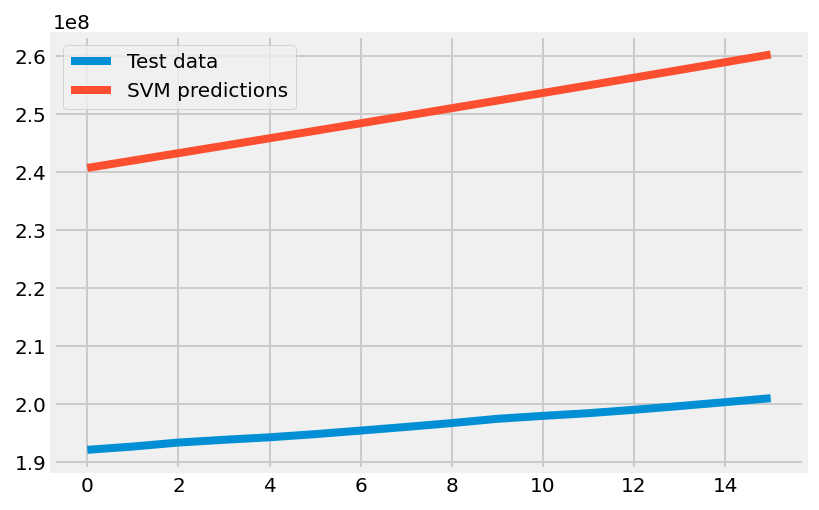

In [36]:
# Check against data
svm_test_pred = svm_confirmed.predict(X_test_confirmed)
plt.plot(y_test_confirmed)
plt.plot(svm_test_pred)
plt.legend(['Test data', 'SVM predictions'])
print('MAE: ', mean_absolute_error(svm_test_pred, y_test_confirmed))
print('MSE: ', mean_squared_error(svm_test_pred, y_test_confirmed))

In [37]:
# Transform data for polynomial regression
poly = PolynomialFeatures(degree=4)
poly_X_train_confirmed = poly.fit_transform(X_train_confirmed)
poly_X_test_confirmed = poly.fit_transform(X_test_confirmed)
poly_future_forecast = poly.fit_transform(future_forecast)

bayesian_poly = PolynomialFeatures(degree=5)
bayesian_poly_X_train_confirmed = bayesian_poly.fit_transform(X_train_confirmed)
bayesian_poly_X_test_confirmed = bayesian_poly.fit_transform(X_test_confirmed)
bayesian_poly_future_forecast = bayesian_poly.fit_transform(future_forecast)

In [38]:
# Polynomial regression
linear_model = LinearRegression(normalize=True, fit_intercept=False)
linear_model.fit(poly_X_train_confirmed, y_train_confirmed)
test_linear_pred = linear_model.predict(poly_X_test_confirmed)
linear_pred = linear_model.predict(poly_future_forecast)
print("MAE: ", mean_absolute_error(test_linear_pred, y_test_confirmed))
print('MSE: ', mean_squared_error(test_linear_pred, y_test_confirmed))

MAE:  2768380.745169759
MSE:  9239364231949.73


In [39]:
print(linear_model.coef_)

[[ 6.61928191e+05  8.31419186e+03 -2.44578806e+02  4.31431486e+00
  -4.98929772e-03]]


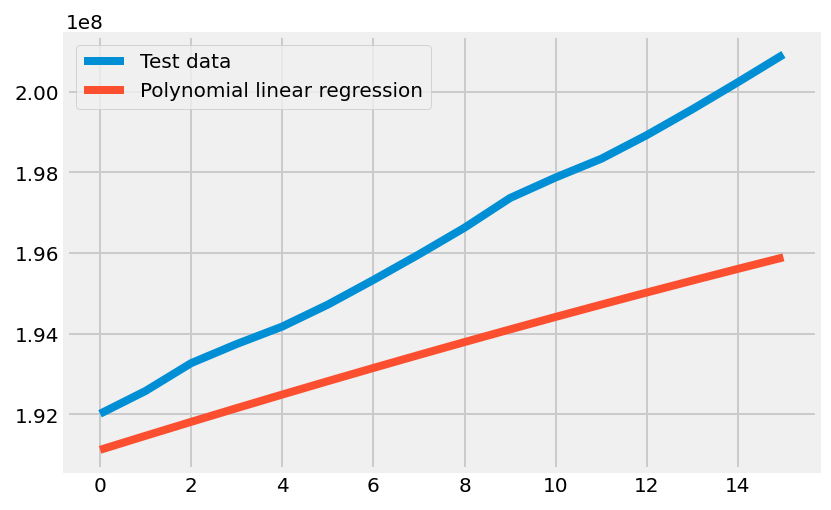

In [40]:
plt.plot(y_test_confirmed)
plt.plot(test_linear_pred)
plt.legend(['Test data', 'Polynomial linear regression'])

In [41]:
# Bayesian ridge polynomial regression
tol = [1e-6, 1e-5, 1e-4, 1e-3, 1e-2]
alpha_1 = [1e-7, 1e-6, 1e-5, 1e-4, 1e-3]
alpha_2 = [1e-7, 1e-6, 1e-5, 1e-4, 1e-3]
lambda_1 = [1e-7, 1e-6, 1e-5, 1e-4, 1e-3]
lambda_2 = [1e-7, 1e-6, 1e-5, 1e-4, 1e-3]
normalize = [True, False]

bayesian_grid = {'tol': tol, 'alpha_1': alpha_1, 'alpha_2': alpha_2, 'lambda_1': lambda_1, 'lambda_2': lambda_2, 'normalize': normalize}

bayesian = BayesianRidge(fit_intercept=False)
bayesian_search = RandomizedSearchCV(bayesian, bayesian_grid, scoring='neg_mean_squared_error', cv=3, return_train_score=True, n_jobs=1, n_iter=40, verbose=1)
bayesian_search.fit(bayesian_poly_X_train_confirmed, y_train_confirmed)

Fitting 3 folds for each of 40 candidates, totalling 120 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 120 out of 120 | elapsed:    0.2s finished


RandomizedSearchCV(cv=3, estimator=BayesianRidge(fit_intercept=False),
                   n_iter=40, n_jobs=1,
                   param_distributions={'alpha_1': [1e-07, 1e-06, 1e-05, 0.0001,
                                                    0.001],
                                        'alpha_2': [1e-07, 1e-06, 1e-05, 0.0001,
                                                    0.001],
                                        'lambda_1': [1e-07, 1e-06, 1e-05,
                                                     0.0001, 0.001],
                                        'lambda_2': [1e-07, 1e-06, 1e-05,
                                                     0.0001, 0.001],
                                        'normalize': [True, False],
                                        'tol': [1e-06, 1e-05, 0.0001, 0.001,
                                                0.01]},
                   return_train_score=True, scoring='neg_mean_squared_error',
                   verbose=1)

In [42]:
bayesian_search.best_params_

{'tol': 0.01,
 'normalize': True,
 'lambda_2': 1e-07,
 'lambda_1': 0.001,
 'alpha_2': 0.0001,
 'alpha_1': 0.001}

In [43]:
bayesian_confirmed = bayesian_search.best_estimator_
test_bayesian_pred = bayesian_confirmed.predict(bayesian_poly_X_test_confirmed)
bayesian_pred = bayesian_confirmed.predict(bayesian_poly_future_forecast)
print('MAE: ', mean_absolute_error(test_bayesian_pred, y_test_confirmed))
print('MSE: ', mean_squared_error(test_bayesian_pred, y_test_confirmed))

MAE:  3197499.3105381653
MSE:  12081945475957.557


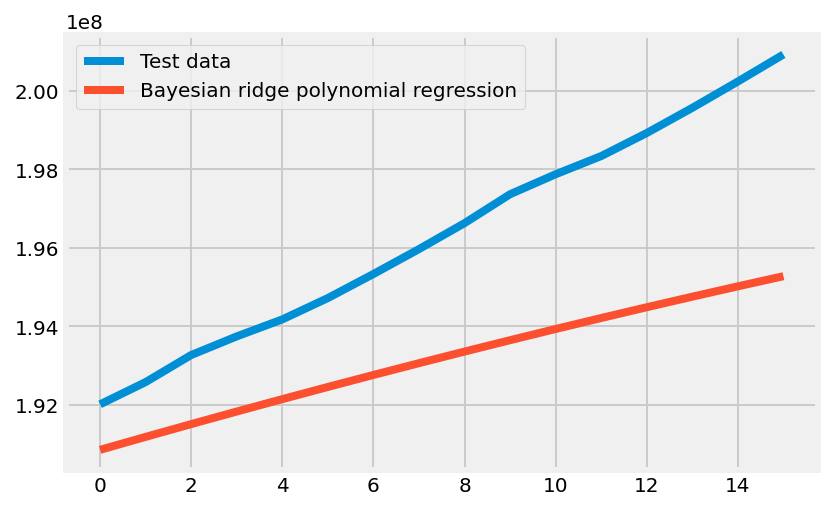

In [44]:
plt.plot(y_test_confirmed)
plt.plot(test_bayesian_pred)
plt.legend(['Test data', 'Bayesian ridge polynomial regression'])

In [45]:
# Worldwide overwiew

In [46]:
# Helper method for flattening the data, so it can be displayed on a bar graph
def flatten(arr):
  a = []
  arr = arr.tolist()
  for i in arr:
    a.append(i[0])
  return a


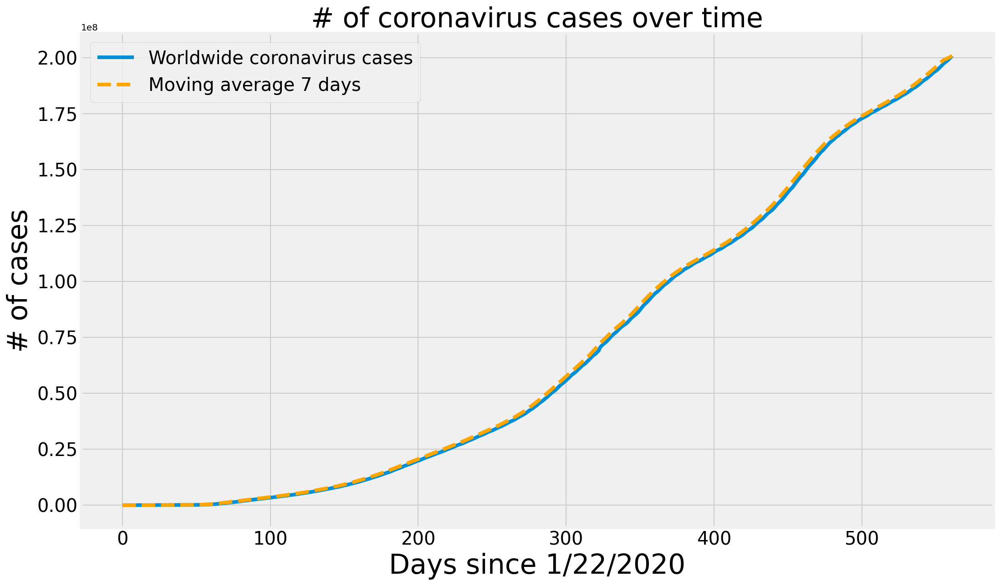

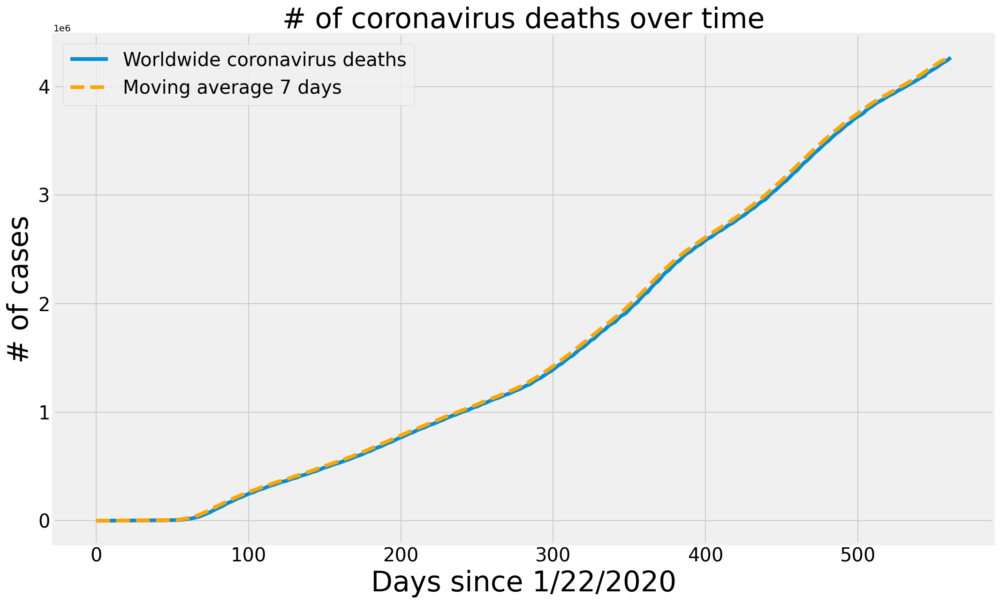

In [47]:
adjusted_dates = adjusted_dates.reshape(1, -1)[0]
plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, world_cases)
plt.plot(adjusted_dates, world_confirmed_avg, linestyle='dashed', color='orange')
plt.title('# of coronavirus cases over time', size=30)
plt.xlabel('Days since 1/22/2020', size=30)
plt.ylabel('# of cases', size=30)
plt.legend(['Worldwide coronavirus cases', 'Moving average {} days'.format(window)], prop={'size': 20})
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, total_deaths)
plt.plot(adjusted_dates, world_death_avg, linestyle='dashed', color='orange')
plt.title('# of coronavirus deaths over time', size=30)
plt.xlabel('Days since 1/22/2020', size=30)
plt.ylabel('# of cases', size=30)
plt.legend(['Worldwide coronavirus deaths', 'Moving average {} days'.format(window)], prop={'size': 20})
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

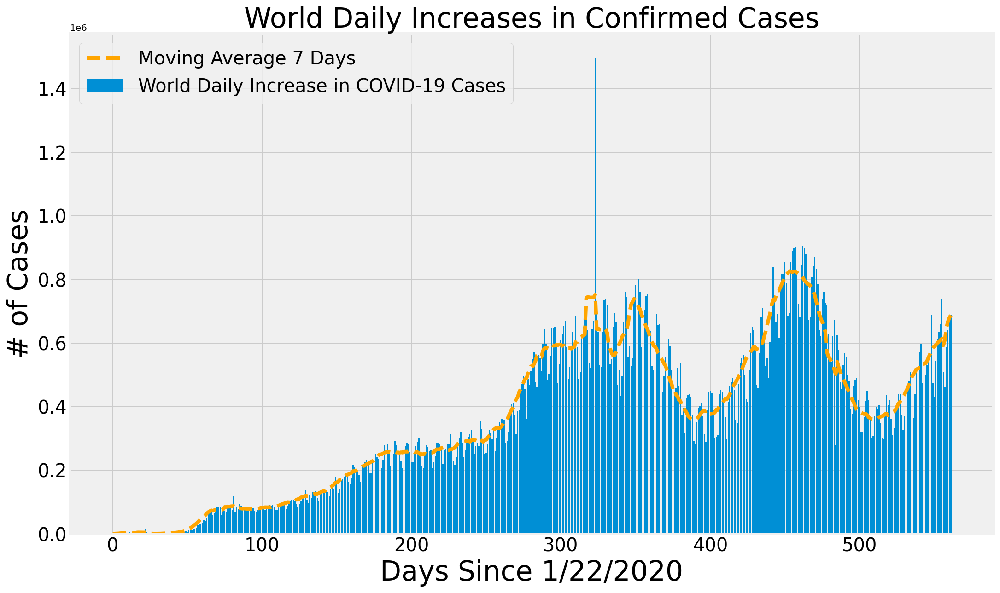

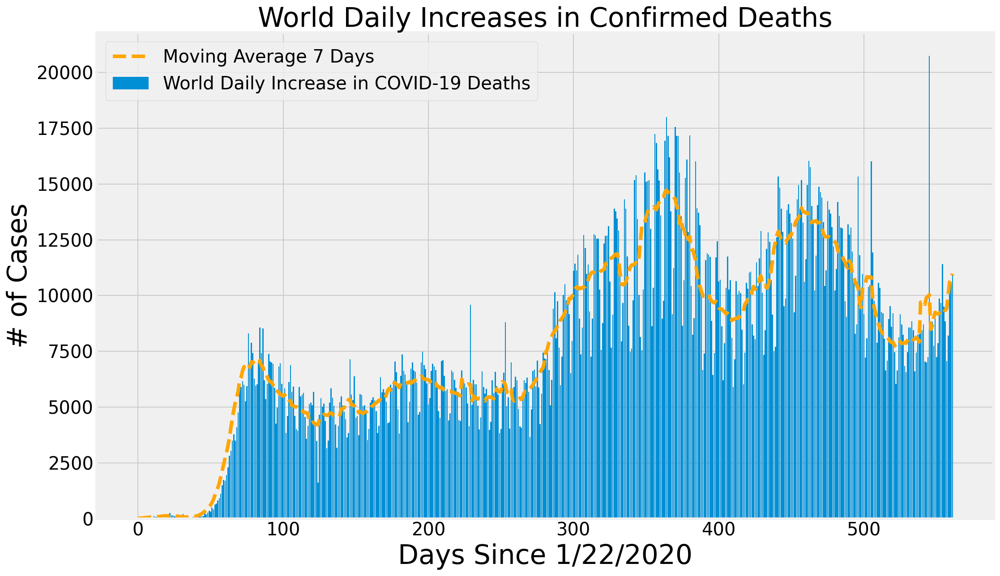

In [48]:
plt.figure(figsize=(16, 10))
plt.bar(adjusted_dates, world_daily_increase)
plt.plot(adjusted_dates, world_daily_increase_avg, color='orange', linestyle='dashed')
plt.title('World Daily Increases in Confirmed Cases', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.legend(['Moving Average {} Days'.format(window), 'World Daily Increase in COVID-19 Cases'], prop={'size': 20})
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

plt.figure(figsize=(16, 10))
plt.bar(adjusted_dates, world_daily_death)
plt.plot(adjusted_dates, world_daily_death_avg, color='orange', linestyle='dashed')
plt.title('World Daily Increases in Confirmed Deaths', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.legend(['Moving Average {} Days'.format(window), 'World Daily Increase in COVID-19 Deaths'], prop={'size': 20})
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

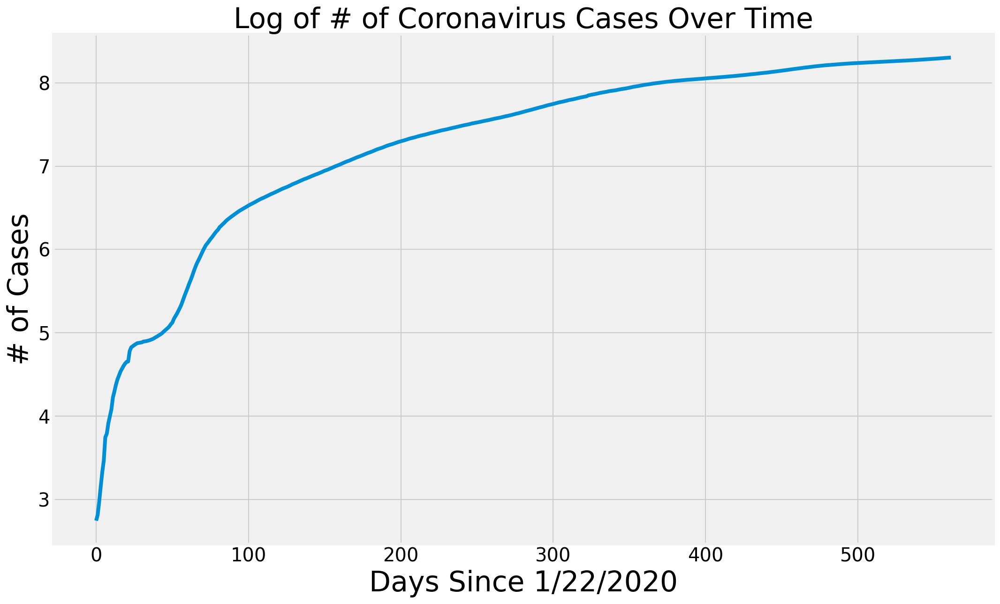

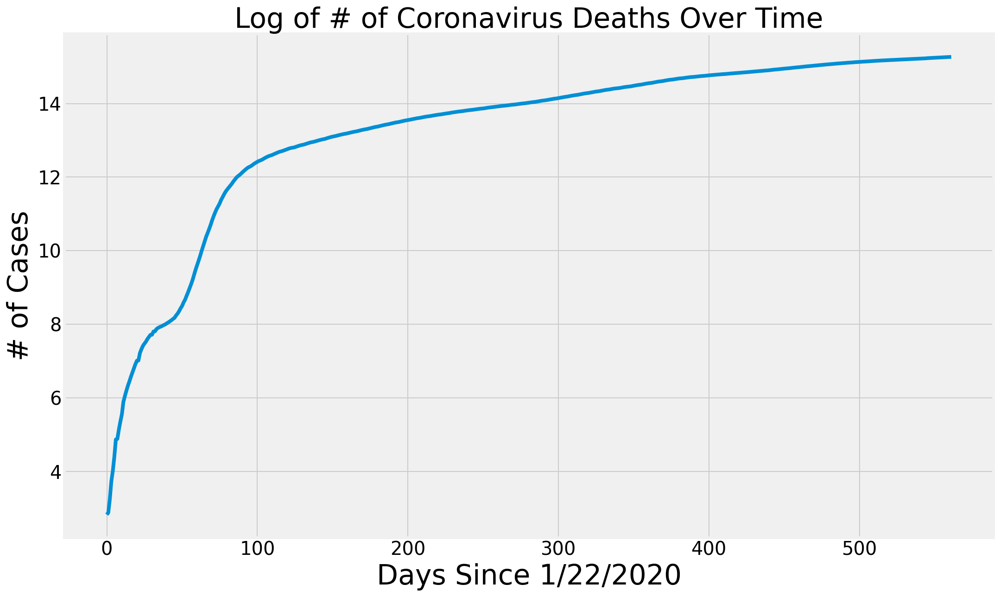

In [49]:
plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, np.log10(world_cases))
plt.title('Log of # of Coronavirus Cases Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, np.log(total_deaths))
plt.title('Log of # of Coronavirus Deaths Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

In [50]:
# Country specific graphs

def country_plot(x, y1, y2, y3, country):
  # Window is set at 14 in the beginning of the notebook
  confirmed_avg = moving_average(y1, window)
  confirmed_increase_avg = moving_average(y2, window)
  death_increase_avg = moving_average(y3, window)
  
  plt.figure(figsize=(16, 10))
  plt.plot(x, y1)
  plt.plot(x, confirmed_avg, color='red', linestyle='dashed')
  plt.legend(['{} Confirmed Cases'.format(country), 'Moving Average {} Days'.format(window)], prop={'size': 20})
  plt.title('{} Confirmed Cases'.format(country), size=30)
  plt.xlabel('Days Since 1/22/2020', size=30)
  plt.ylabel('# of Cases', size=30)
  plt.xticks(size=20)
  plt.yticks(size=20)
  plt.show()

  plt.figure(figsize=(16, 10))
  plt.bar(x, y2)
  plt.plot(x, confirmed_increase_avg, color='red', linestyle='dashed')
  plt.legend(['Moving Average {} Days'.format(window), '{} Daily Increase in Confirmed Cases'.format(country)], prop={'size': 20})
  plt.title('{} Daily Increases in Confirmed Cases'.format(country), size=30)
  plt.xlabel('Days Since 1/22/2020', size=30)
  plt.ylabel('# of Cases', size=30)
  plt.xticks(size=20)
  plt.yticks(size=20)
  plt.show()

  plt.figure(figsize=(16, 10))
  plt.bar(x, y3)
  plt.plot(x, death_increase_avg, color='red', linestyle='dashed')
  plt.legend(['Moving Average {} Days'.format(window), '{} Daily Increase in Confirmed Deaths'.format(country)], prop={'size': 20})
  plt.title('{} Daily Increases in Deaths'.format(country), size=30)
  plt.xlabel('Days Since 1/22/2020', size=30)
  plt.ylabel('# of Cases', size=30)
  plt.xticks(size=20)
  plt.yticks(size=20)
  plt.show()

In [51]:
# Helper function for getting country's cases, deaths and recoveries
def get_country_info(country_name):
  country_cases = []
  country_deaths = []

  for i in dates:
    country_cases.append(confirmed_df[confirmed_df['Country/Region'] == country_name][i].sum())
    country_deaths.append(deaths_df[deaths_df['Country/Region'] == country_name][i].sum())
  return (country_cases, country_deaths)

In [52]:
def country_visualisations(country_name):
  country_info = get_country_info(country_name)
  country_cases = country_info[0]
  country_deaths = country_info[1]

  country_daily_increase = daily_increase(country_cases)
  country_daily_death = daily_increase(country_deaths)

  country_plot(adjusted_dates, country_cases, country_daily_increase, country_daily_death, country_name)

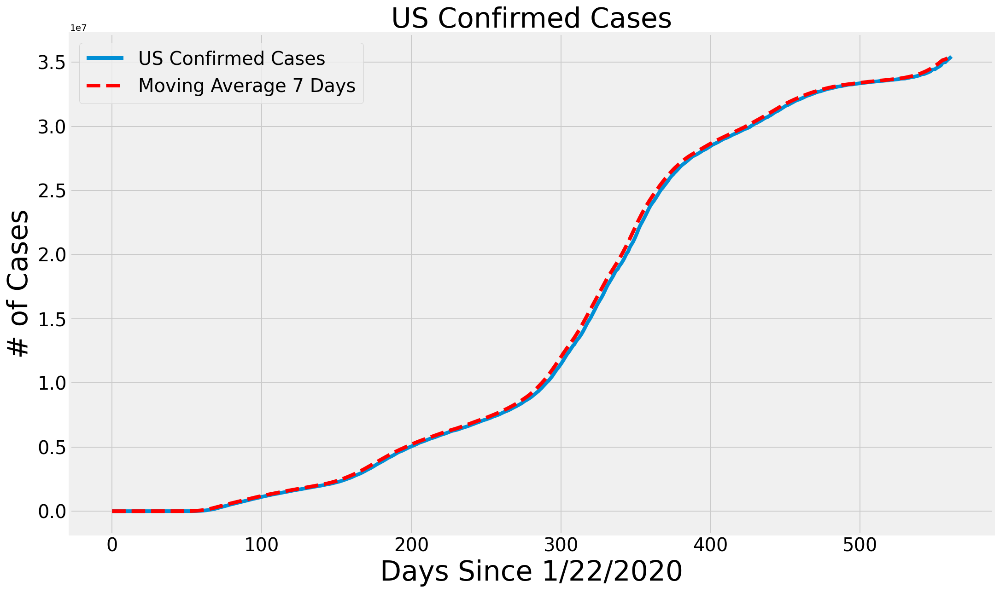

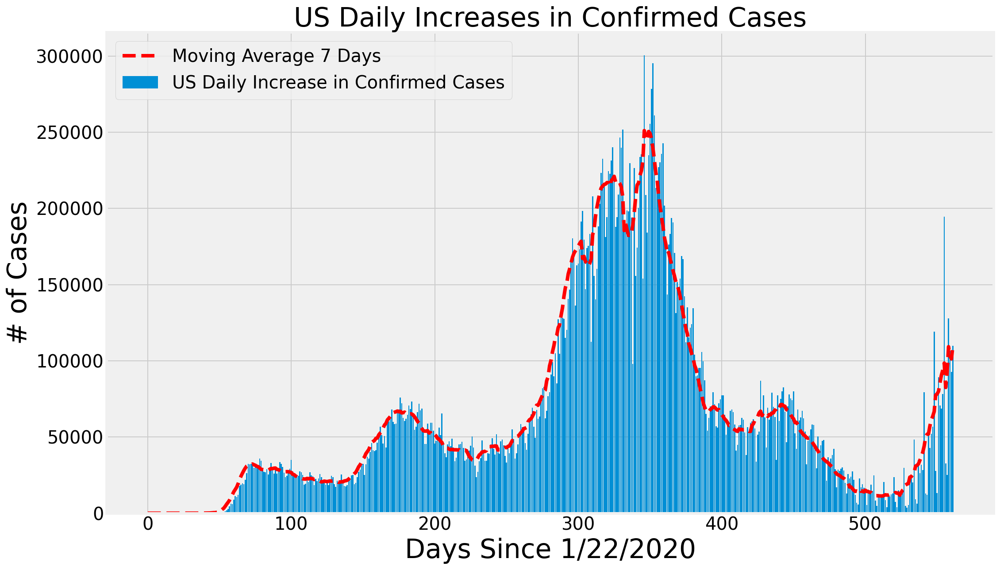

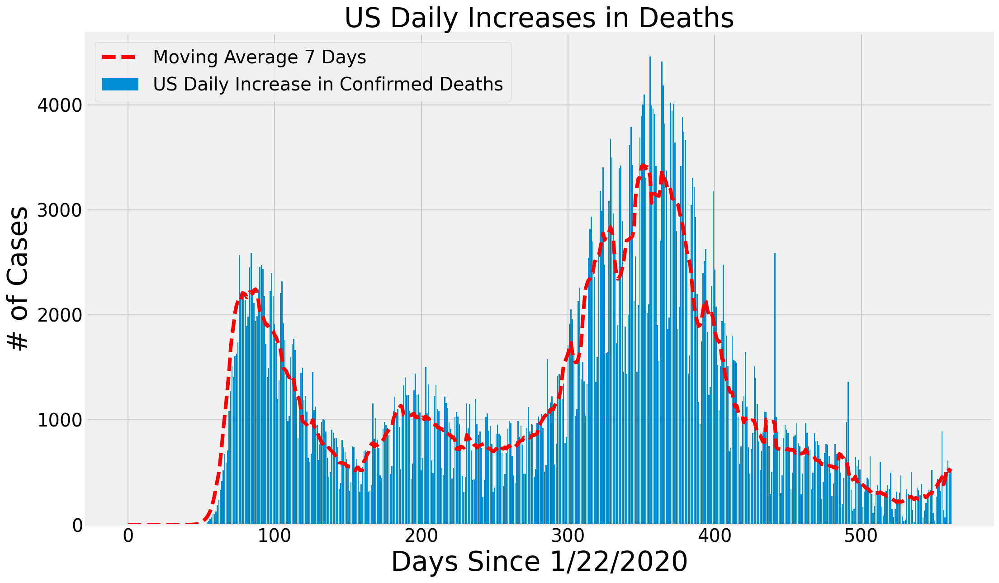

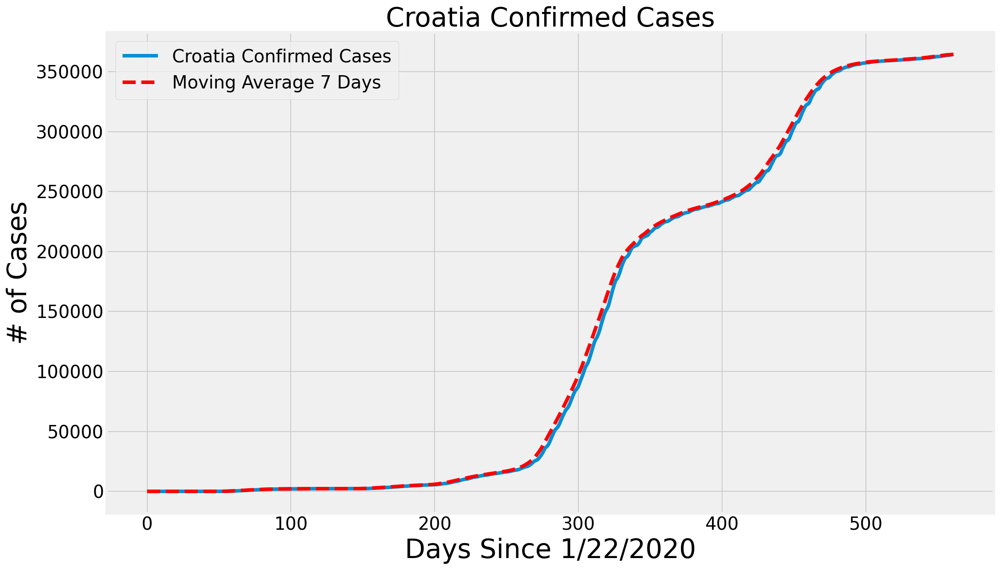

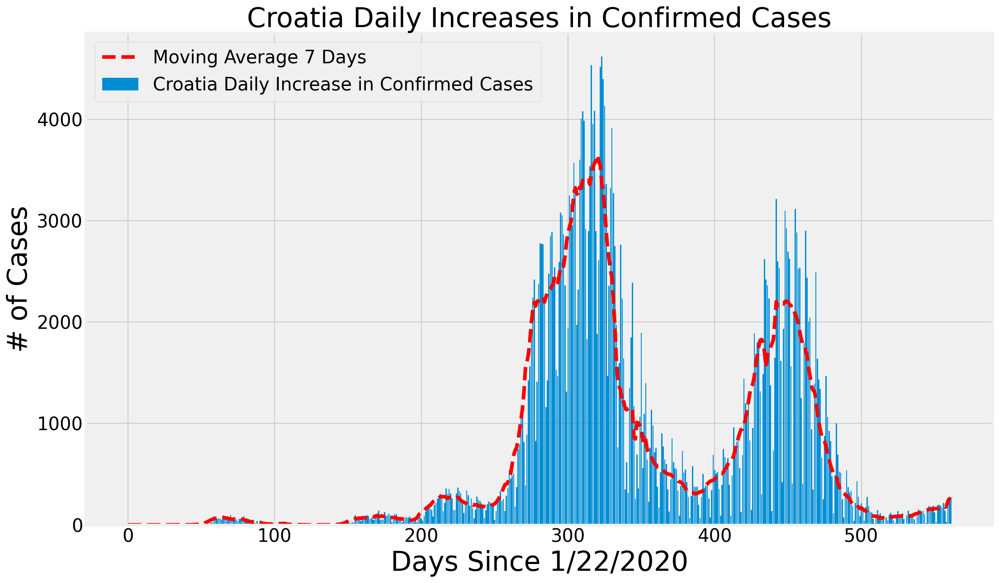

...

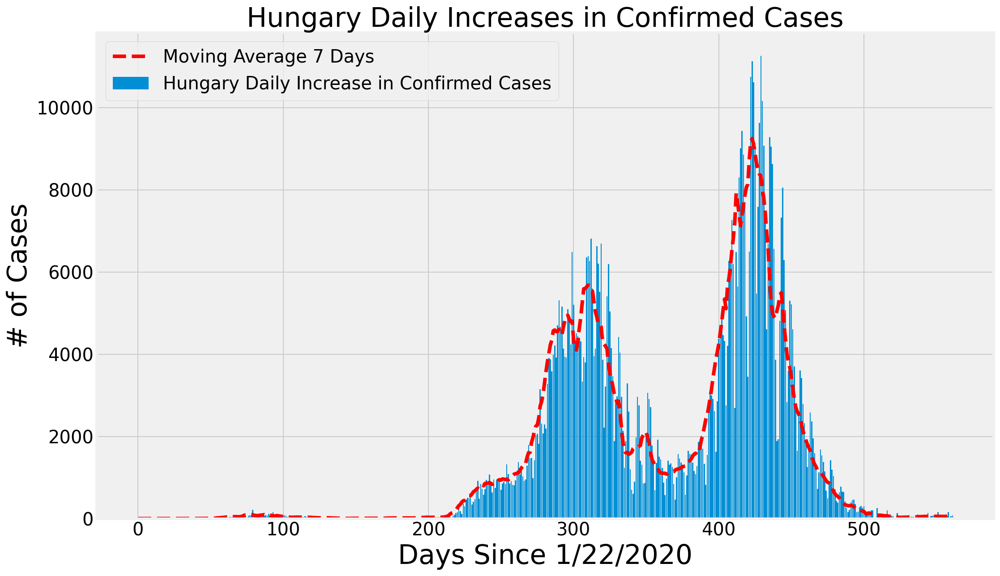

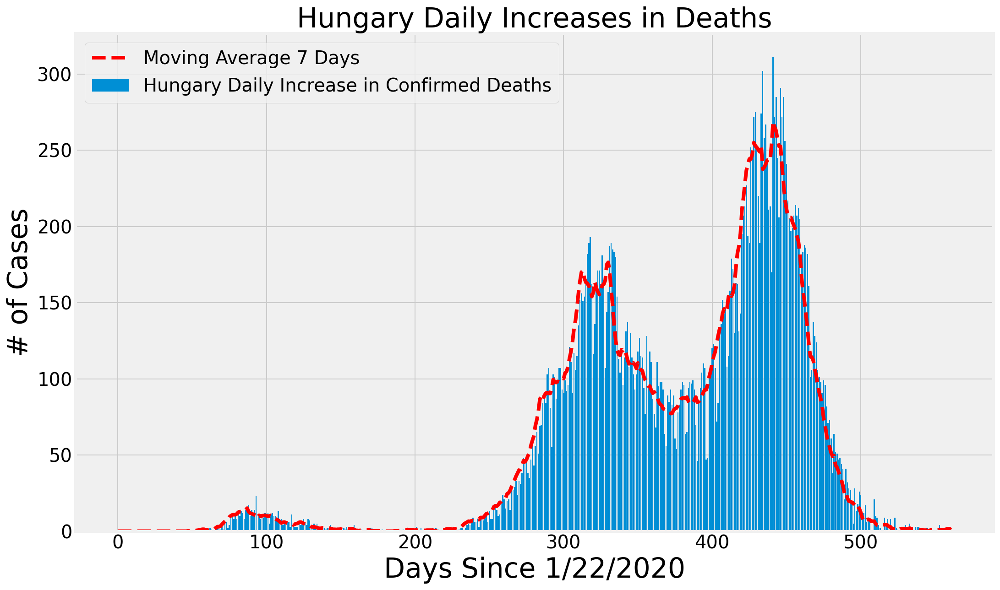

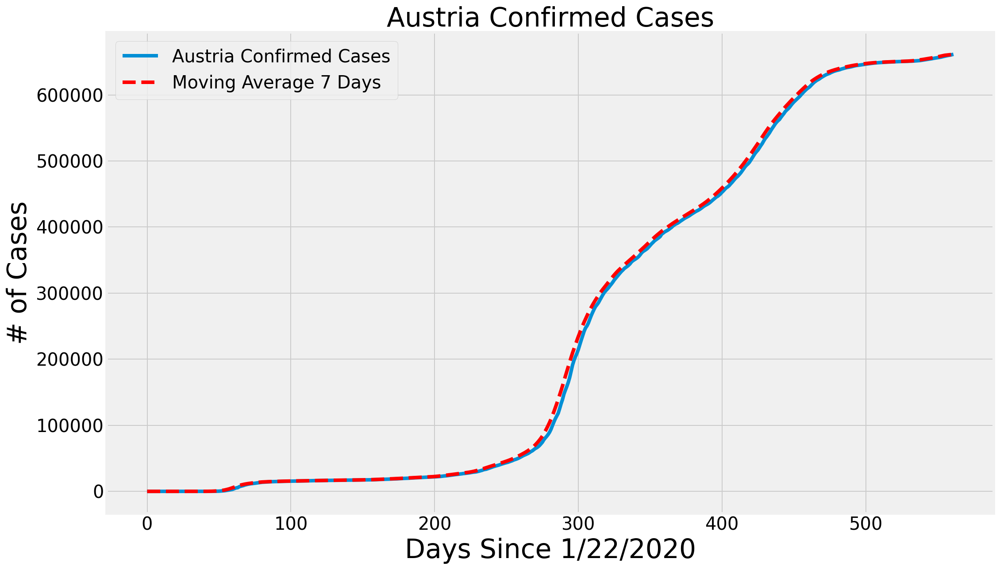

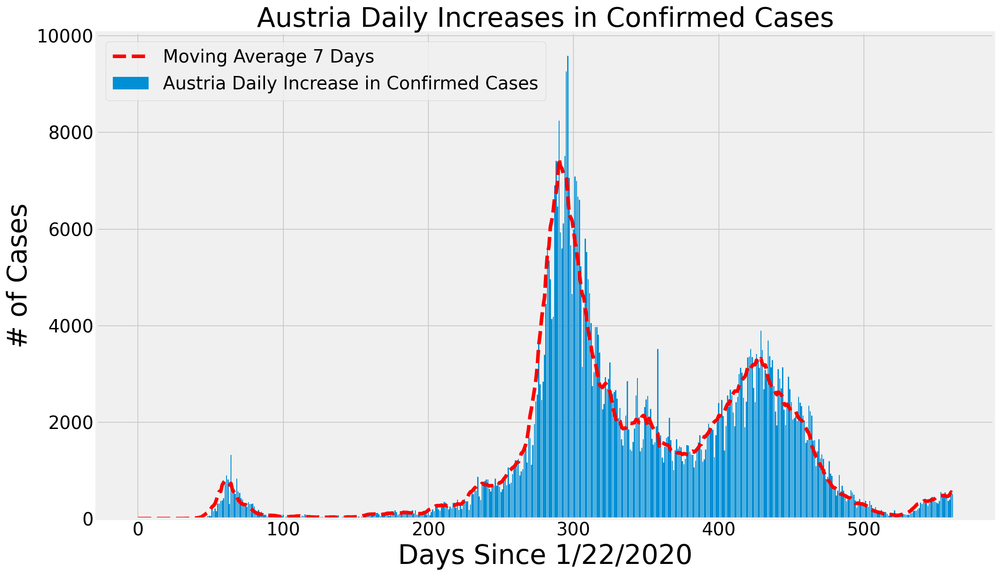

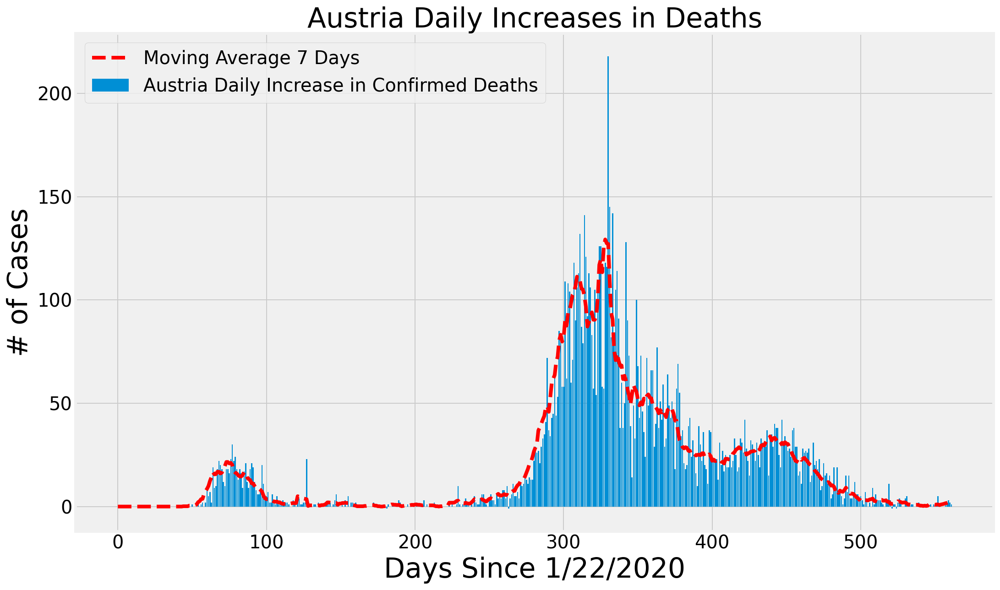

In [53]:
# Country specific graphs
countries = ['US', 'Croatia', 'Slovenia', 'Serbia', 'Italy', 'Hungary', 'Austria']

for country in countries:
  country_visualisations(country)

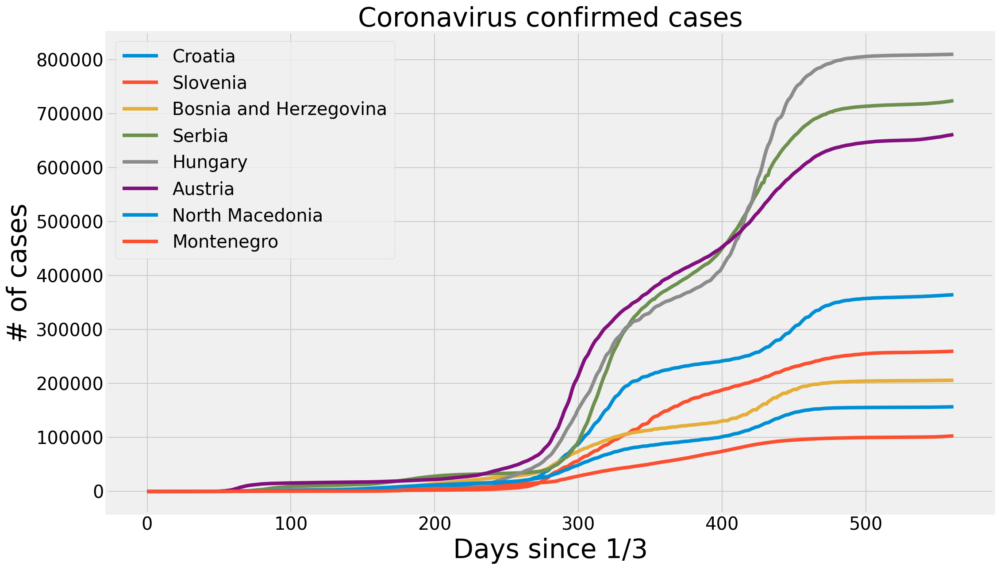

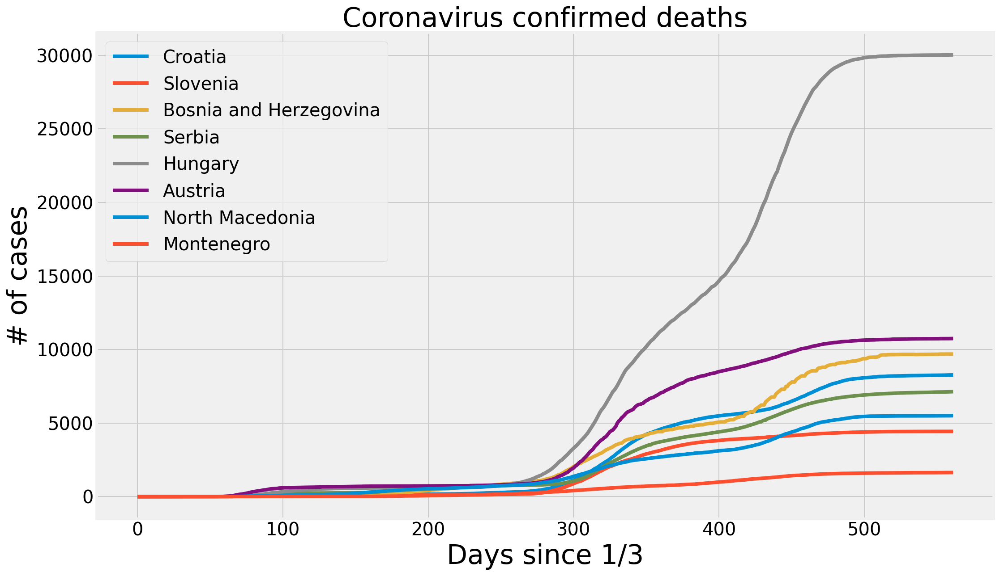

In [54]:
# Compare countries
compare_countries = ['Croatia', 'Slovenia', 'Bosnia and Herzegovina', 'Serbia', 'Hungary', 'Austria', 'North Macedonia', 'Montenegro']
graph_name = ['Coronavirus confirmed cases', 'Coronavirus confirmed deaths']

for num in range(2):
  plt.figure(figsize=(16, 10))
  for country in compare_countries:
    plt.plot(get_country_info(country)[num])
  plt.legend(compare_countries, prop={'size': 20})
  plt.xlabel('Days since 1/3', size=30)
  plt.ylabel('# of cases', size=30)
  plt.title(graph_name[num], size=30)
  plt.xticks(size=20)
  plt.yticks(size=20)
  plt.show()

In [55]:
# Predictions for confirmed coronavirus cases worldwide
def plot_predictions(x, y, pred, algo_name, color):
  plt.figure(figsize=(16, 10))
  plt.plot(x, y)
  plt.plot(future_forecast, pred, linestyle='dashed', color=color)
  plt.title('Worldwide coronavirus cases over time', size=30)
  plt.xlabel('Days since 1/22/2020', size=30)
  plt.ylabel('# of cases', size=30)
  plt.legend(['Confirmed cases', algo_name], prop={'size': 20})
  plt.xticks(size=20)
  plt.yticks(size=20)
  plt.show()

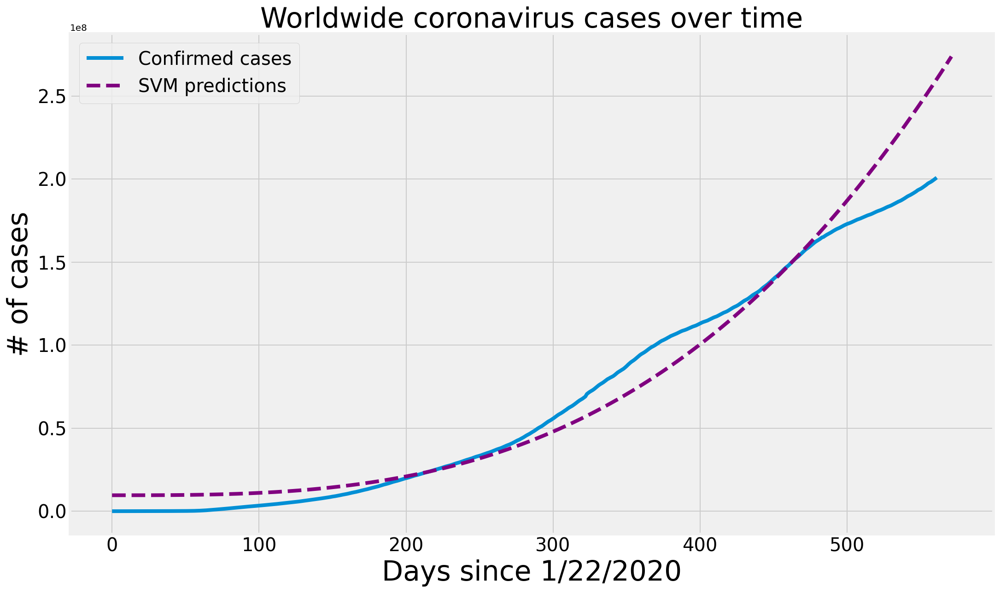

In [56]:
# Prediction models include support vector machine, polynomial regression and bayesian ridge regression
plot_predictions(adjusted_dates, world_cases, svm_pred, 'SVM predictions', 'purple')

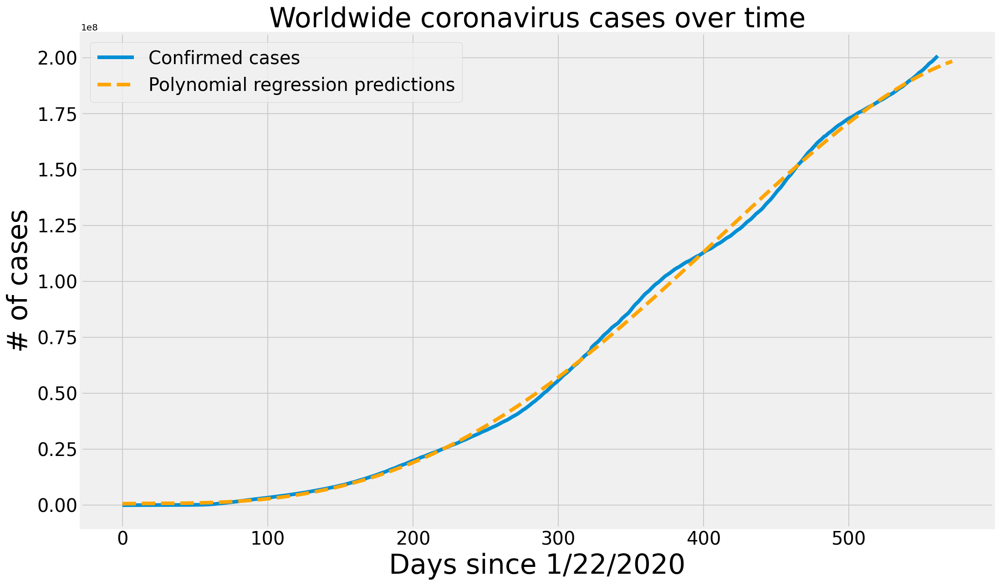

In [57]:
plot_predictions(adjusted_dates, world_cases, linear_pred, 'Polynomial regression predictions', 'orange')

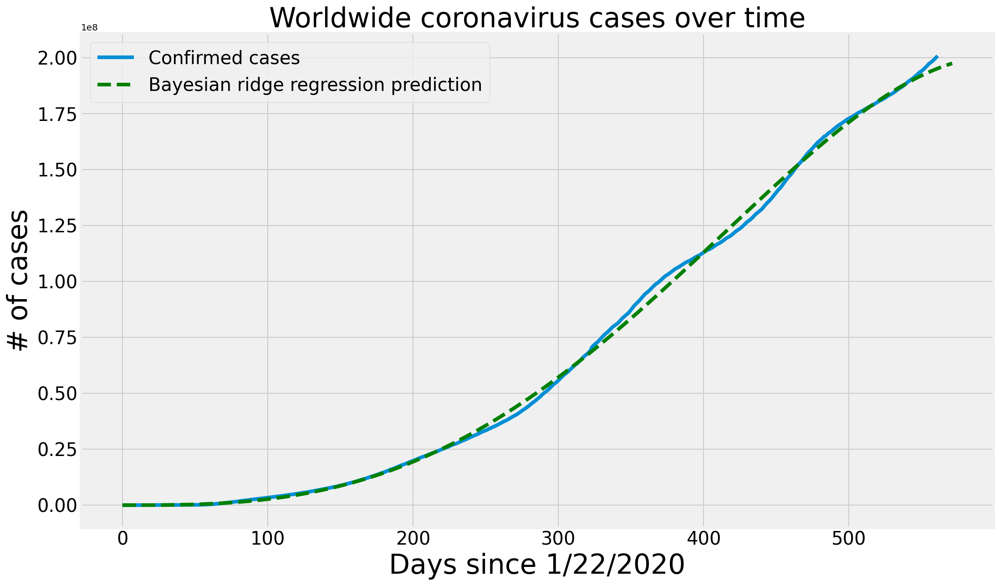

In [58]:
plot_predictions(adjusted_dates, world_cases, bayesian_pred, 'Bayesian ridge regression prediction', 'green')

In [59]:
# Future predictions using SVM
svm_df = pd.DataFrame({'Date': future_forecast_dates[-10:], 'SVM predicted # of confirmed cases worldwide': np.round(svm_pred[-10:])})
svm_df.style.background_gradient(cmap='Reds')

,Date,SVM predicted # of confirmed cases worldwide
0,01/23/2020,261563427.000000
1,01/23/2020,262910794.000000
2,01/23/2020,264262956.000000
3,01/23/2020,265619921.000000
4,01/23/2020,266981698.000000
5,01/23/2020,268348295.000000
6,01/23/2020,269719722.000000
7,01/23/2020,271095986.000000
8,01/23/2020,272477095.000000
9,01/23/2020,273863060.000000


In [60]:
# Future predictions using polynomial regression
linear_pred = linear_pred.reshape(1,-1)[0]
linear_df = pd.DataFrame({'Date': future_forecast_dates[-10:], 'Polynomial Predicted # of Confirmed Cases Worldwide': np.round(linear_pred[-10:])})
linear_df.style.background_gradient(cmap='Reds')

,Date,Polynomial Predicted # of Confirmed Cases Worldwide
0,01/23/2020,196175787.000000
1,01/23/2020,196452225.000000
2,01/23/2020,196723771.000000
3,01/23/2020,196990383.000000
4,01/23/2020,197252018.000000
5,01/23/2020,197508635.000000
6,01/23/2020,197760192.000000
7,01/23/2020,198006648.000000
8,01/23/2020,198247959.000000
9,01/23/2020,198484084.000000


In [61]:


# Future predictions using Bayesian Ridge 
bayesian_df = pd.DataFrame({'Date': future_forecast_dates[-10:], 'Bayesian Ridge Predicted # of Confirmed Cases Worldwide': np.round(bayesian_pred[-10:])})
bayesian_df.style.background_gradient(cmap='Reds')



,Date,Bayesian Ridge Predicted # of Confirmed Cases Worldwide
0,01/23/2020,195531078.000000
1,01/23/2020,195778110.000000
2,01/23/2020,196019528.000000
3,01/23/2020,196255282.000000
4,01/23/2020,196485318.000000
5,01/23/2020,196709584.000000
6,01/23/2020,196928030.000000
7,01/23/2020,197140601.000000
8,01/23/2020,197347245.000000
9,01/23/2020,197547909.000000


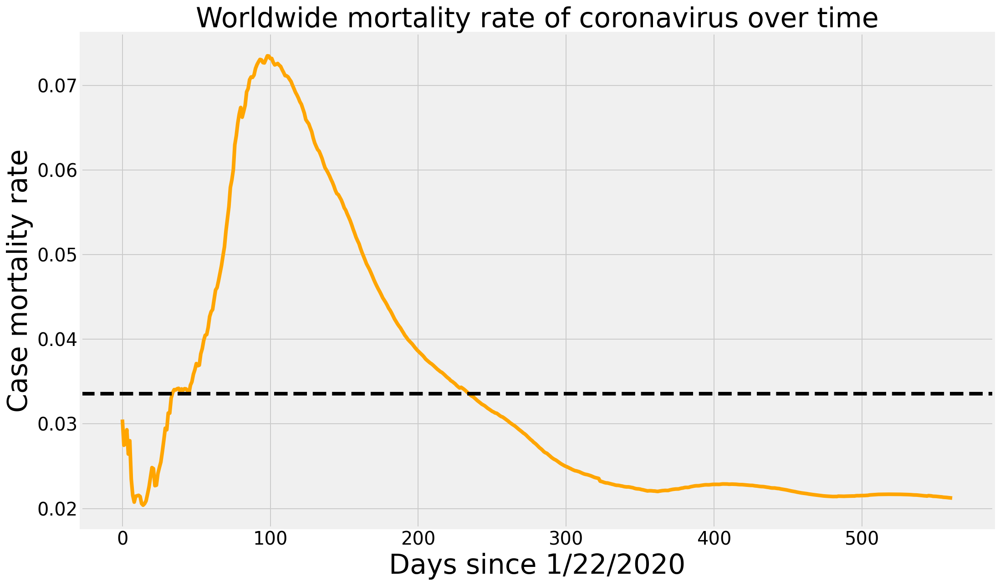

In [62]:
# Mortality rate (susceptible to change)

mean_mortality_rate = np.mean(mortality_rate)
plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, mortality_rate, color='orange')
plt.axhline(y=mean_mortality_rate, linestyle='--', color='black')
plt.title('Worldwide mortality rate of coronavirus over time', size=30)
plt.xlabel('Days since 1/22/2020', size=30)
plt.ylabel('Case mortality rate', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

In [63]:
unique_countries = list(latest_data['Country_Region'].unique())

In [64]:
country_confirmed_cases = []
country_death_cases = []
country_active_cases = []
country_incidence_rate = []
country_mortality_rate = []

no_cases = []

for i in unique_countries:
  cases = latest_data[latest_data['Country_Region'] == i]['Confirmed'].sum()
  if cases > 0:
    country_confirmed_cases.append(cases)
  else:
    no_cases.append(i)
  
for i in no_cases:
  unique_countries.remove(i)

# sort countries by the number of confirmed cases
unique_countries = [k for k, v in sorted(zip(unique_countries, country_confirmed_cases), key=operator.itemgetter(1), reverse=True)]

for i in range(len(unique_countries)):
  country_confirmed_cases[i] = latest_data[latest_data['Country_Region'] == unique_countries[i]]['Confirmed'].sum()
  country_death_cases.append(latest_data[latest_data['Country_Region'] == unique_countries[i]]['Incident_Rate'].sum())
  country_active_cases.append(latest_data[latest_data['Country_Region']==unique_countries[i]]['Active'].sum())
  country_incidence_rate.append(latest_data[latest_data['Country_Region']==unique_countries[i]]['Incident_Rate'].sum())
  country_mortality_rate.append(country_death_cases[i] / country_confirmed_cases[i])


In [65]:
# Data table showing data for several countries. Includes number of confirmed cases, deaths, active cases, incidence rate and mortality rate.

country_df = pd.DataFrame({'Country Name': unique_countries, 
                           'Number of confirmed cases': [format(int(i), ',d') for i in country_confirmed_cases], 
                           'Number of deaths': [format(int(i), ',d') for i in country_death_cases],
                           'Number of active cases': [format(int(i), ',d') for i in country_active_cases],
                           'Incidence rate': country_incidence_rate,
                           'Mortality rate': country_mortality_rate})





In [66]:
country_df.style.background_gradient(cmap='Oranges')

,Country Name,Number of confirmed cases,Number of deaths,Number of active cases,Incidence rate,Mortality rate
0,US,"35,237,950","33,853,172",0,33853172.034160,0.960702
1,India,"31,769,132","132,812","410,353",132812.228075,0.004181
2,Brazil,"19,985,817","297,095","1,656,157",297095.949960,0.014865
3,Russia,"6,251,953","347,624","503,553",347624.180616,0.055602
4,France,"6,242,948","72,004","5,716,330",72004.739089,0.011534
5,United Kingdom,"5,951,736","81,093","5,797,188",81093.251433,0.013625
6,Turkey,"5,795,665","6,871","271,931",6871.862834,0.001186
7,Argentina,"4,961,880","10,978","249,407",10978.636345,0.002213
8,Colombia,"4,807,979","247,473","80,624",247473.940947,0.051472
9,Spain,"4,523,310","175,668","4,291,161",175668.625248,0.038836


In [67]:
unique_provinces = list(latest_data['Province_State'].unique())

In [68]:
len(unique_provinces)

578

In [69]:
province_confirmed_cases = []
province_country = [] 
province_death_cases = [] 
province_active = [] 
province_incidence_rate = []
province_mortality_rate = [] 

no_cases = [] 
for i in unique_provinces:
    cases = latest_data[latest_data['Province_State']==i]['Confirmed'].sum()
    if cases > 0:
        province_confirmed_cases.append(cases)
    else:
        no_cases.append(i)
 
# remove areas with no confirmed cases
for i in no_cases:
    unique_provinces.remove(i)
    
unique_provinces = [k for k, v in sorted(zip(unique_provinces, province_confirmed_cases), key=operator.itemgetter(1), reverse=True)]
for i in range(len(unique_provinces)):
    province_confirmed_cases[i] = latest_data[latest_data['Province_State']==unique_provinces[i]]['Confirmed'].sum()
    province_country.append(latest_data[latest_data['Province_State']==unique_provinces[i]]['Country_Region'].unique()[0])
    province_death_cases.append(latest_data[latest_data['Province_State']==unique_provinces[i]]['Deaths'].sum())
    province_active.append(latest_data[latest_data['Province_State']==unique_provinces[i]]['Active'].sum())
    province_incidence_rate.append(latest_data[latest_data['Province_State']==unique_provinces[i]]['Incident_Rate'].sum())
    province_mortality_rate.append(province_death_cases[i]/province_confirmed_cases[i])

In [70]:
province_limit = 100
province_df = pd.DataFrame({'Province/State Name': unique_provinces[:province_limit], 'Country': province_country[:province_limit],
                            'Numbeer of confirmed cases': [format(int(i), ',d') for i in province_confirmed_cases[:province_limit]],
                            'Number of deaths': [format(int(i), ',d') for i in province_death_cases[:province_limit]],
                            'Number of active cases': [format(int(i), ',d') for i in province_active[:province_limit]],
                            'Incidence rate': province_incidence_rate[:province_limit],
                            'Mortality rate': province_mortality_rate[:province_limit]})

province_df.style.background_gradient(cmap='Oranges')


,Province/State Name,Country,Numbeer of confirmed cases,Number of deaths,Number of active cases,Incidence rate,Mortality rate
0,Maharashtra,India,"6,321,068","133,215","77,729",5133.060931,0.021075
1,England,United Kingdom,"5,173,082","114,108","5,058,974",9241.409002,0.022058
2,Sao Paulo,Brazil,"4,073,622","139,464","225,087",8871.311773,0.034236
3,California,US,"3,997,767","64,598",0,493859.983505,0.016159
4,Kerala,India,"3,449,149","17,103","173,736",9661.632536,0.004959
5,Texas,US,"3,172,919","53,395",0,2842447.701762,0.016828
6,Karnataka,India,"2,909,958","36,650","24,305",4307.049012,0.012595
7,Florida,US,"2,634,234","39,079",0,779845.646623,0.014835
8,Tamil Nadu,India,"2,565,452","34,159","20,217",3295.748000,0.013315
9,New York,US,"2,158,388","53,670",0,524942.842727,0.024866


In [71]:
# Return the data table with province info for a given country

def country_table(country_name):
  states = list(latest_data[latest_data['Country_Region'] == country_name]['Province_State'].unique())

  state_confirmed_cases = []
  state_death_cases = []
  state_active = []
  state_incidence_rate = []
  state_mortality_rate = []

  no_cases = []

  for i in states:
    cases = latest_data[latest_data['Province_State'] == i]['Confirmed'].sum()
    if cases > 0:
      state_confirmed_cases.append(cases)
    else:
      no_cases.append(i)
    
  # Remove areas with no confirmed cases
  for i in no_cases:
    states.remove(i)
  
  states = [k for k, v in sorted(zip(states, state_confirmed_cases), key=operator.itemgetter(1), reverse=True)]

  for i in range(len(states)):
    state_confirmed_cases[i] = latest_data[latest_data['Province_State'] == states[i]]['Confirmed'].sum()
    state_death_cases.append(latest_data[latest_data['Province_State'] == states[i]]['Deaths'].sum())

    state_active.append(latest_data[latest_data['Province_State'] == states[i]]['Active'].sum())
    state_incidence_rate.append(latest_data[latest_data['Province_State'] == states[i]]['Incident_Rate'].sum())
    state_mortality_rate.append(state_death_cases[i] / state_confirmed_cases[i])
  
  state_df = pd.DataFrame({'State Name': states, 
                           'Number of confirmed cases': [format(int(i), ',d') for i in state_confirmed_cases],
                           'Number of deaths': [format(int(i), ',d') for i in state_death_cases],
                           'Number of active cases': [format(int(i), ',d') for i in state_active],
                           'Incidence rate': state_incidence_rate,
                           'Mortality rate': state_mortality_rate})
  return state_df 

In [72]:
india_table = country_table('India')
india_table.style.background_gradient(cmap='Oranges')

,State Name,Number of confirmed cases,Number of deaths,Number of active cases,Incidence rate,Mortality rate
0,Maharashtra,"6,321,068","133,215","77,729",5133.060931,0.021075
1,Kerala,"3,449,149","17,103","173,736",9661.632536,0.004959
2,Karnataka,"2,909,958","36,650","24,305",4307.049012,0.012595
3,Tamil Nadu,"2,565,452","34,159","20,217",3295.748000,0.013315
4,Andhra Pradesh,"1,971,554","13,428","20,170",3657.569385,0.006811
5,Uttar Pradesh,"1,708,562","22,765",672,718.237106,0.013324
6,West Bengal,"1,530,024","18,170","10,767",1536.025204,0.011876
7,Delhi,"1,436,451","25,058",519,7677.072247,0.017444
8,Chhattisgarh,"1,002,600","13,530","1,881",3406.006700,0.013495
9,Odisha,"980,866","6,102","12,676",2115.926596,0.006221


In [73]:
germany_table = country_table('Germany')

In [74]:
germany_table.style.background_gradient(cmap='Oranges')

,State Name,Number of confirmed cases,Number of deaths,Number of active cases,Incidence rate,Mortality rate
0,Nordrhein-Westfalen,"829,571","17,297","7,874",4626.036608,0.020851
1,Bayern,"654,448","15,345","3,903",5004.679690,0.023447
2,Baden-Wurttemberg,"506,464","10,411","2,853",4575.296898,0.020556
3,Hessen,"295,405","7,590","2,515",4714.554816,0.025694
4,Sachsen,"286,789","10,137",752,7032.698151,0.035347
5,Niedersachsen,"265,692","5,819","2,373",3328.452625,0.021901
6,Berlin,"183,276","3,583","1,593",5028.388186,0.019550
7,Rheinland-Pfalz,"157,858","3,906","1,552",3864.480504,0.024744
8,Thuringen,"129,286","4,382",304,6032.536296,0.033894
9,Brandenburg,"109,381","3,818",363,4354.483050,0.034906


In [75]:
uk_table = country_table('United Kingdom')
uk_table.style.background_gradient(cmap='Oranges')

,State Name,Number of confirmed cases,Number of deaths,Number of active cases,Incidence rate,Mortality rate
0,England,"5,173,082","114,108","5,058,974",9241.409002,0.022058
1,Scotland,"348,018","7,952","340,066",6370.105980,0.022849
2,Wales,"243,249","5,616","237,633",7750.238960,0.023087
3,Northern Ireland,"159,471","2,205","157,266",8475.286990,0.013827
4,Unknown,"34,136","25,374","-4,332,487",0.000000,0.743321
5,Channel Islands,"9,443",89,"1,072",5538.448906,0.009425
6,Gibraltar,"5,031",94,293,14932.771363,0.018684
7,Isle of Man,"5,022",30,"1,231",5906.011854,0.005974
8,Bermuda,"2,589",33,53,4157.500040,0.012746
9,British Virgin Islands,"2,500",31,555,8268.016007,0.012400


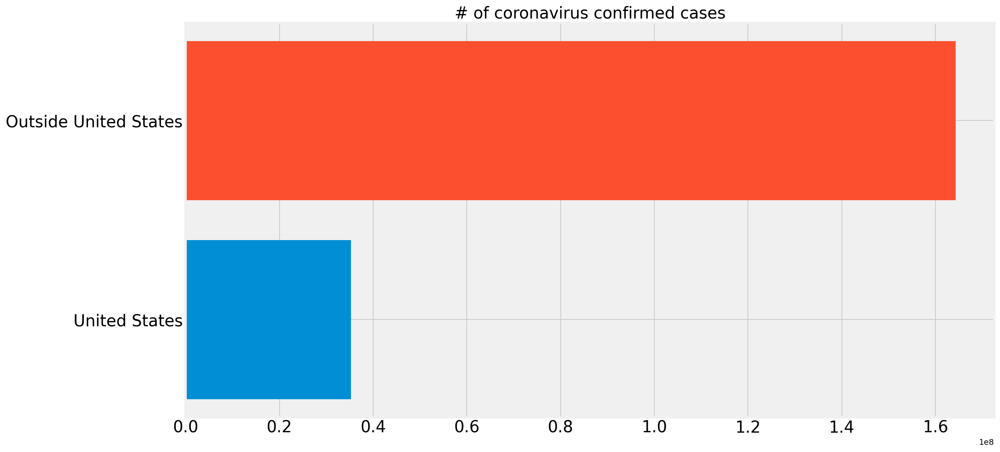

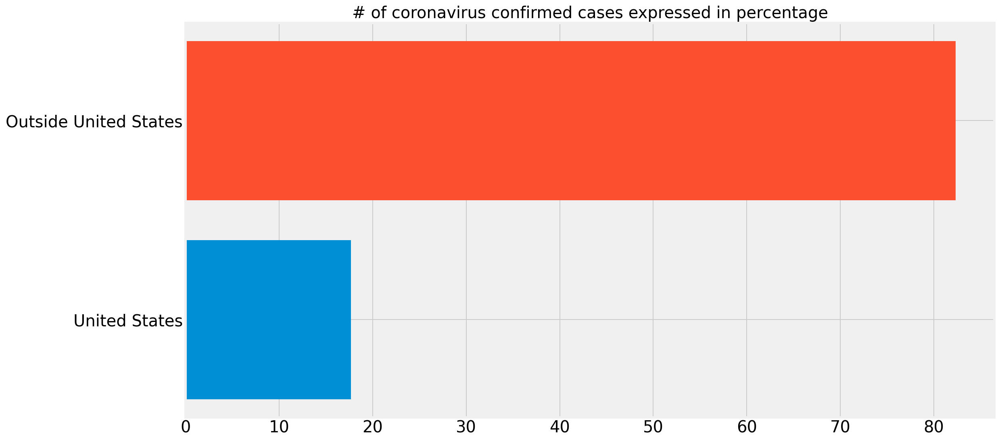

In [76]:
# Bar chart visualizations
total_world_cases = np.sum(country_confirmed_cases)
us_confirmed = latest_data[latest_data['Country_Region'] == 'US']['Confirmed'].sum()
outside_us_confirmed = total_world_cases - us_confirmed

plt.figure(figsize=(16,9))
plt.barh('United States', us_confirmed)
plt.barh('Outside United States', outside_us_confirmed)
plt.title('# of coronavirus confirmed cases', size=20)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

plt.figure(figsize=(16, 9))
plt.barh('United States', (us_confirmed / total_world_cases) * 100)
plt.barh('Outside United States', (outside_us_confirmed / total_world_cases) * 100)
plt.title('# of coronavirus confirmed cases expressed in percentage', size=20)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

In [77]:
print('Outside United States {} cases ({}%):'.format(outside_us_confirmed, np.round((outside_us_confirmed/total_world_cases)*100, 1)))
print('United States {} cases ({}%)'.format(us_confirmed, np.round((us_confirmed/total_world_cases)*100, 1)))
print('Total: {} cases'.format(total_world_cases))

Outside United States 164327888 cases (82.3%):
United States 35237950 cases (17.7%)
Total: 199565838 cases


In [78]:
# Show 10 countries with the most confirmed cases, the rest are grouped into the other category
visual_unique_countries = []
visual_confirmed_cases = []
others = np.sum(country_confirmed_cases[10:])

for i in range(len(country_confirmed_cases[:10])):
  visual_unique_countries.append(unique_countries[i])
  visual_confirmed_cases.append(country_confirmed_cases[i])

visual_unique_countries.append('Others')
visual_confirmed_cases.append(others) 

In [79]:
def plot_bar_graphs(x, y, title):
  plt.figure(figsize=(16, 12))
  plt.barh(x, y)
  plt.title(title, size=20)
  plt.xticks(size=20)
  plt.yticks(size=20)
  plt.show()

def plot_bar_graphs_tall(x, y, title):
  plt.figure(figsize=(19, 18))
  plt.barh(x, y)
  plt.title(title, size=20)
  plt.xticks(size=20)
  plt.yticks(size=20)
  plt.show()

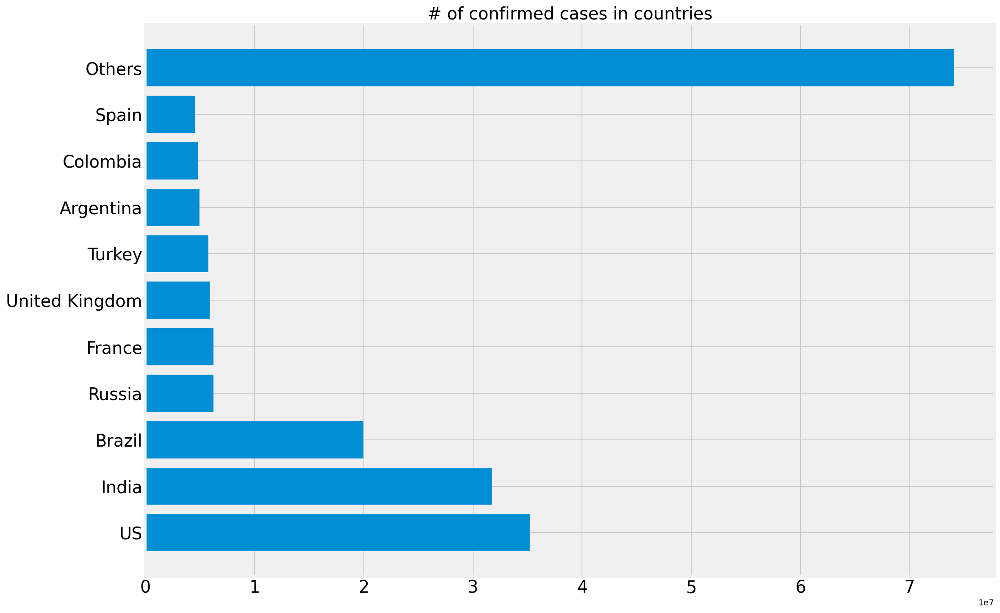

In [80]:
plot_bar_graphs(visual_unique_countries, visual_confirmed_cases, '# of confirmed cases in countries')

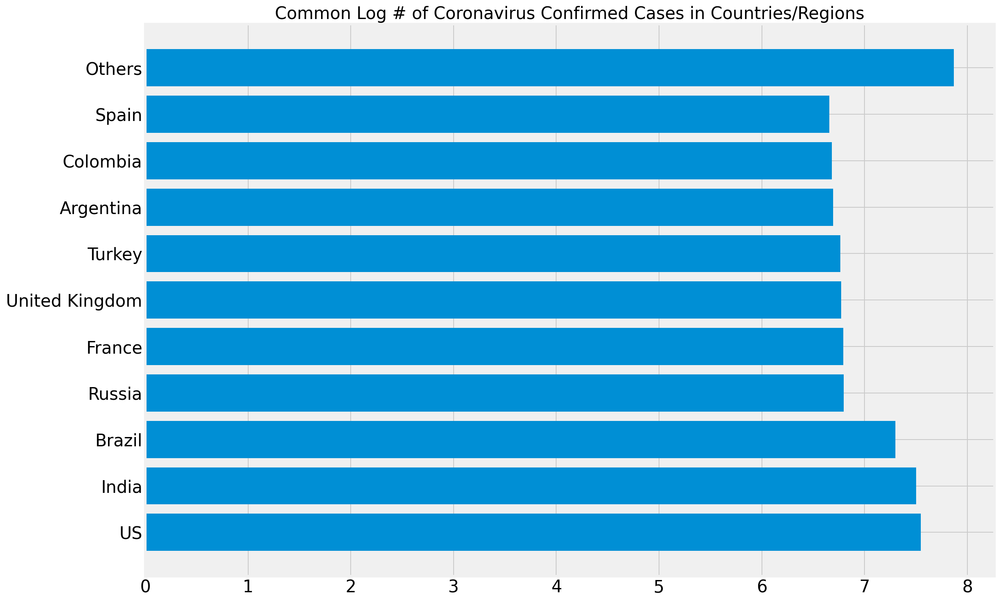

In [81]:
log_country_confirmed_cases = [math.log10(i) for i in visual_confirmed_cases]
plot_bar_graphs(visual_unique_countries, log_country_confirmed_cases, 'Common Log # of Coronavirus Confirmed Cases in Countries/Regions')

In [82]:
# Only show 10 provinces with the most confirmed cases, the rest are grouped into the other category
visual_unique_provinces = [] 
visual_confirmed_cases2 = []
others = np.sum(province_confirmed_cases[10:])
for i in range(len(province_confirmed_cases[:10])):
    visual_unique_provinces.append(unique_provinces[i])
    visual_confirmed_cases2.append(province_confirmed_cases[i])

visual_unique_provinces.append('Others')
visual_confirmed_cases2.append(others)

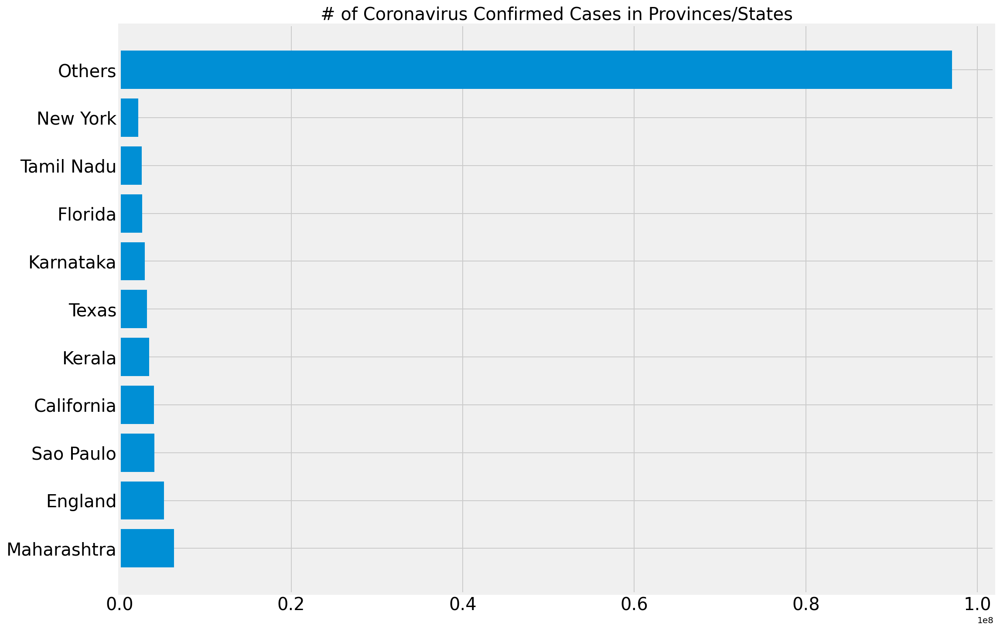

In [83]:
plot_bar_graphs(visual_unique_provinces, visual_confirmed_cases2, '# of Coronavirus Confirmed Cases in Provinces/States')

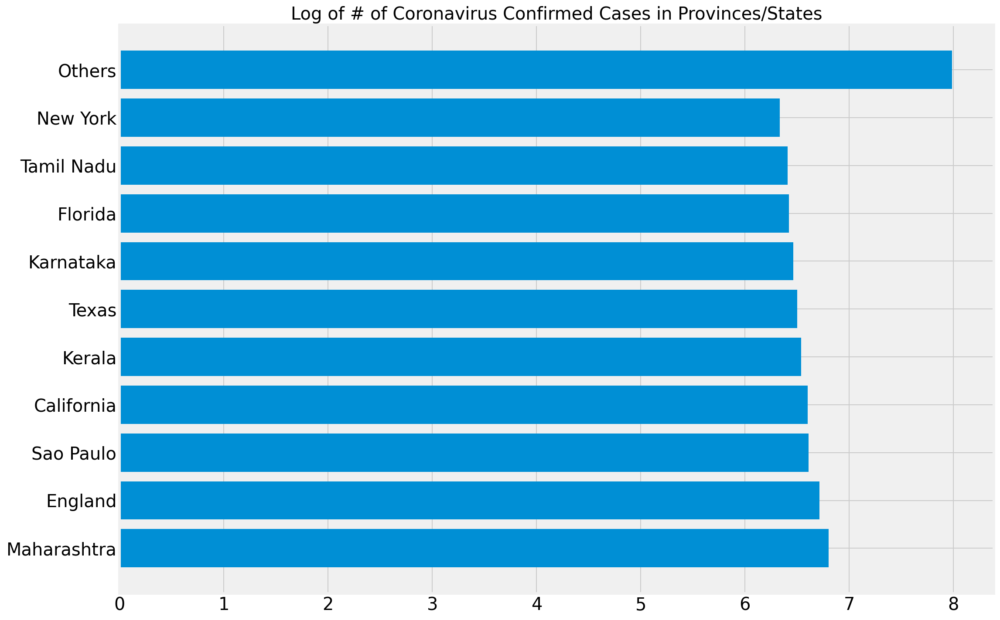

In [84]:
log_province_confirmed_cases = [math.log10(i) for i in visual_confirmed_cases2]
plot_bar_graphs(visual_unique_provinces, log_province_confirmed_cases, 'Log of # of Coronavirus Confirmed Cases in Provinces/States')

In [85]:
# Pie chart visualisation

def plot_pie_charts(x, y, title):
    # more muted color 
    c = ['lightcoral', 'rosybrown', 'sandybrown', 'navajowhite', 'gold',
        'khaki', 'lightskyblue', 'turquoise', 'lightslategrey', 'thistle', 'pink']
    plt.figure(figsize=(15,10))
    plt.title(title, size=20)
    plt.pie(y, colors=c,shadow=True, labels=y)
    plt.legend(x, loc='best', fontsize=12)
    plt.show()



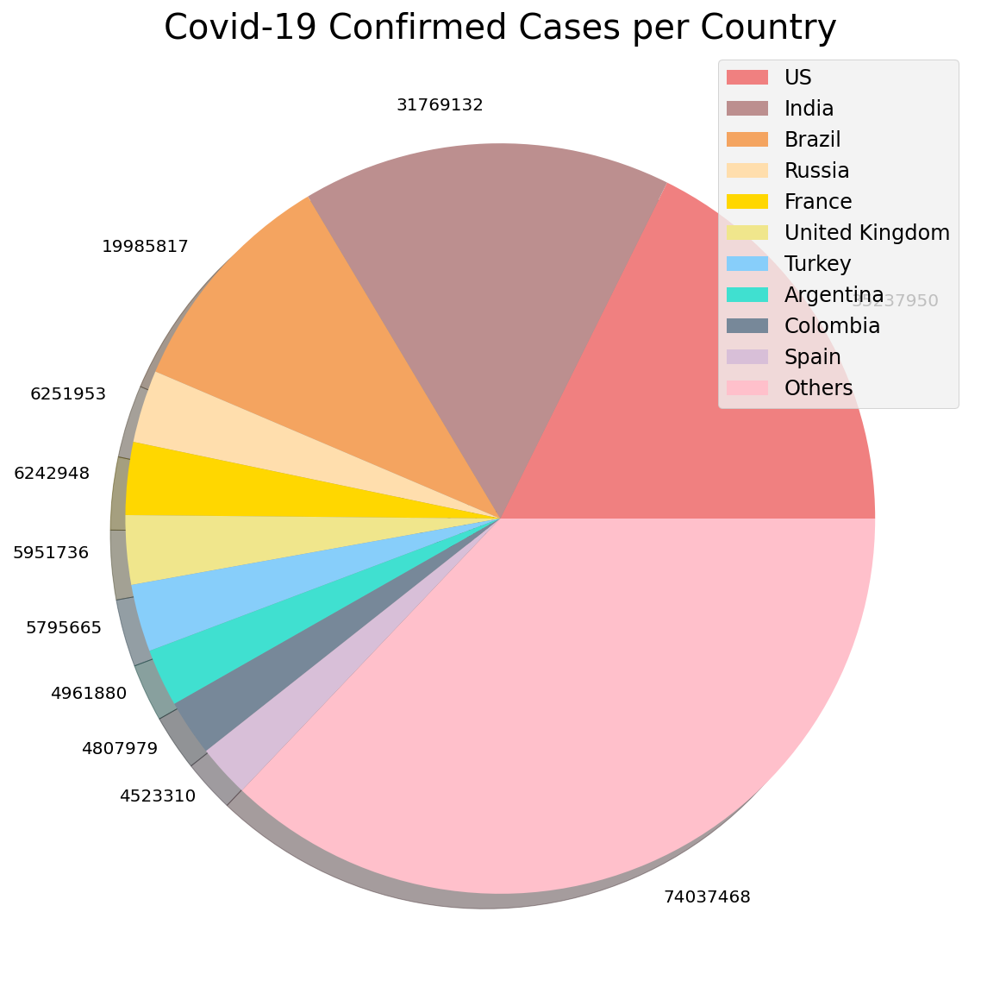

In [86]:
plot_pie_charts(visual_unique_countries, visual_confirmed_cases, 'Covid-19 Confirmed Cases per Country')

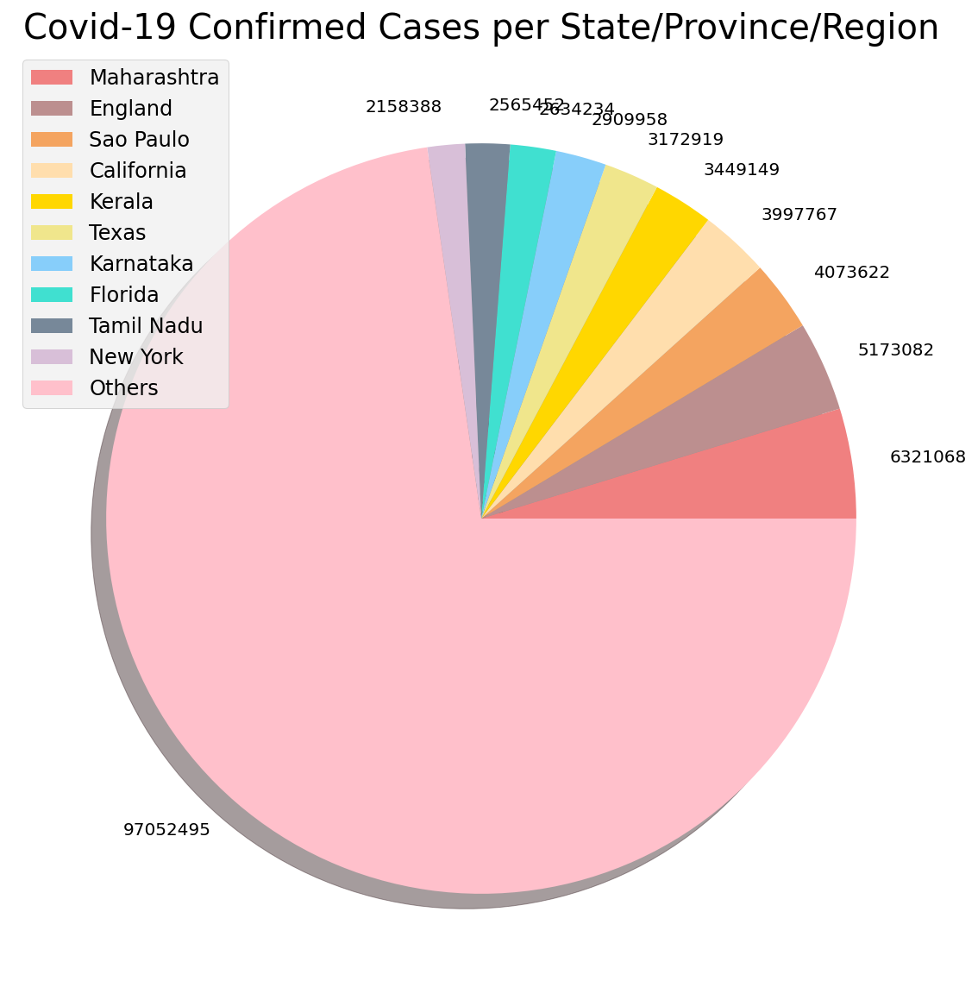

In [87]:
plot_pie_charts(visual_unique_provinces, visual_confirmed_cases2, 'Covid-19 Confirmed Cases per State/Province/Region')

In [88]:
# Plotting countries with regional data using a pie chart 

def plot_pie_country_with_regions(country_name, title):
    regions = list(latest_data[latest_data['Country_Region']==country_name]['Province_State'].unique())
    confirmed_cases = []
    no_cases = [] 
    for i in regions:
        cases = latest_data[latest_data['Province_State']==i]['Confirmed'].sum()
        if cases > 0:
            confirmed_cases.append(cases)
        else:
            no_cases.append(i)

    # remove areas with no confirmed cases
    for i in no_cases:
        regions.remove(i)

    # only show the top 5 states
    regions = [k for k, v in sorted(zip(regions, confirmed_cases), key=operator.itemgetter(1), reverse=True)]

    for i in range(len(regions)):
        confirmed_cases[i] = latest_data[latest_data['Province_State']==regions[i]]['Confirmed'].sum()  
    
    # additional province/state will be considered "others"
    
    if(len(regions)>5):
        regions_5 = regions[:5]
        regions_5.append('Others')
        confirmed_cases_5 = confirmed_cases[:5]
        confirmed_cases_5.append(np.sum(confirmed_cases[5:]))
        plot_pie_charts(regions_5,confirmed_cases_5, title)
    else:
        plot_pie_charts(regions,confirmed_cases, title)

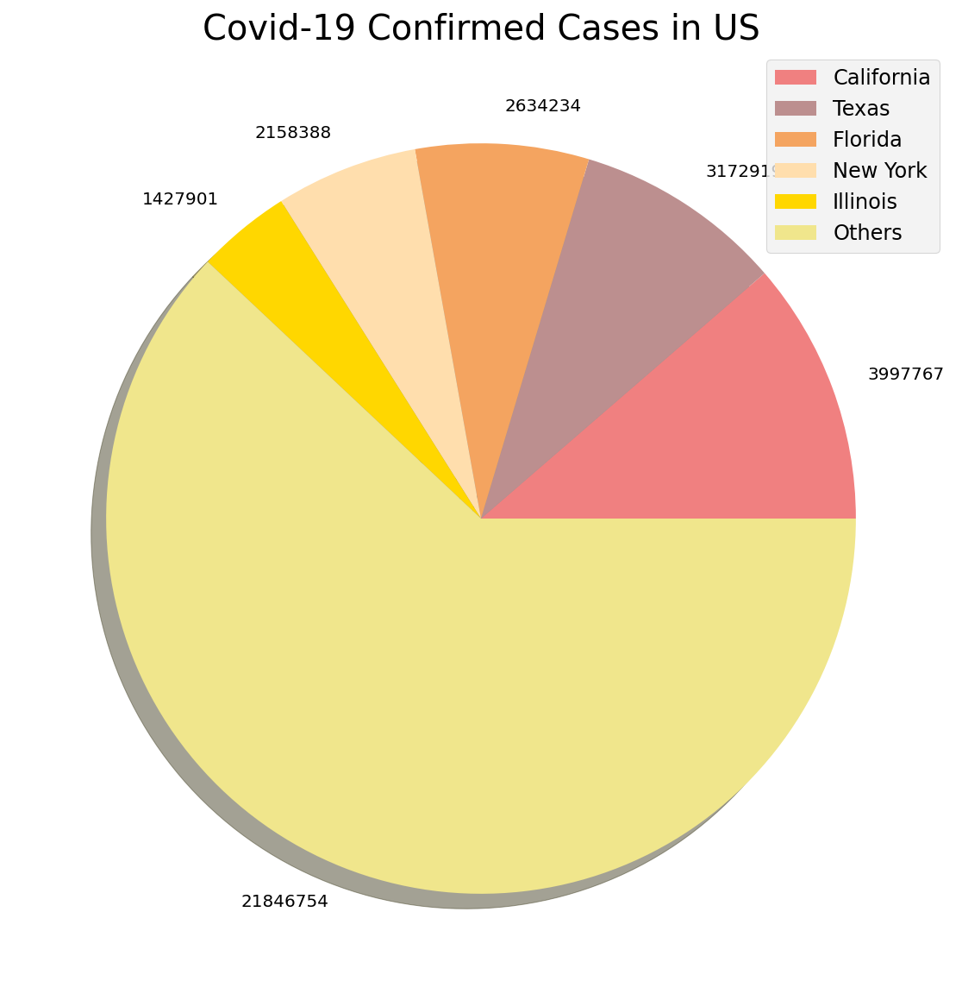

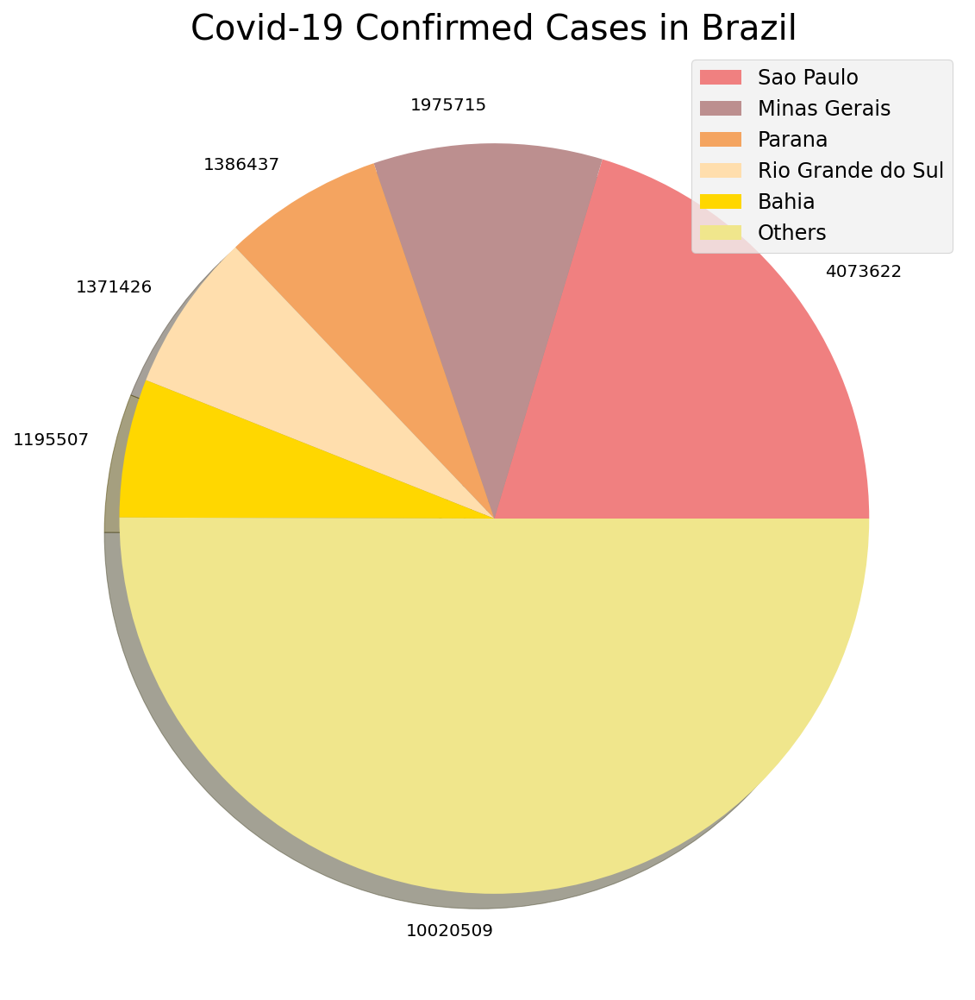

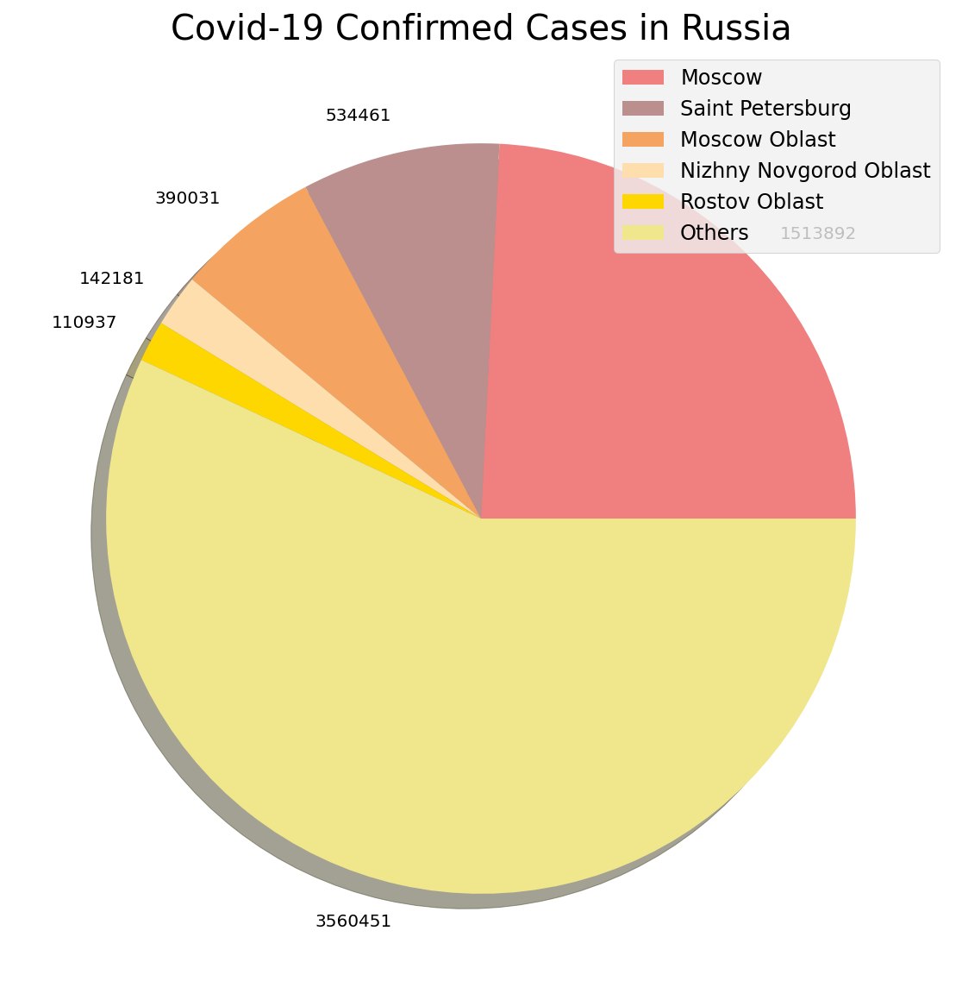

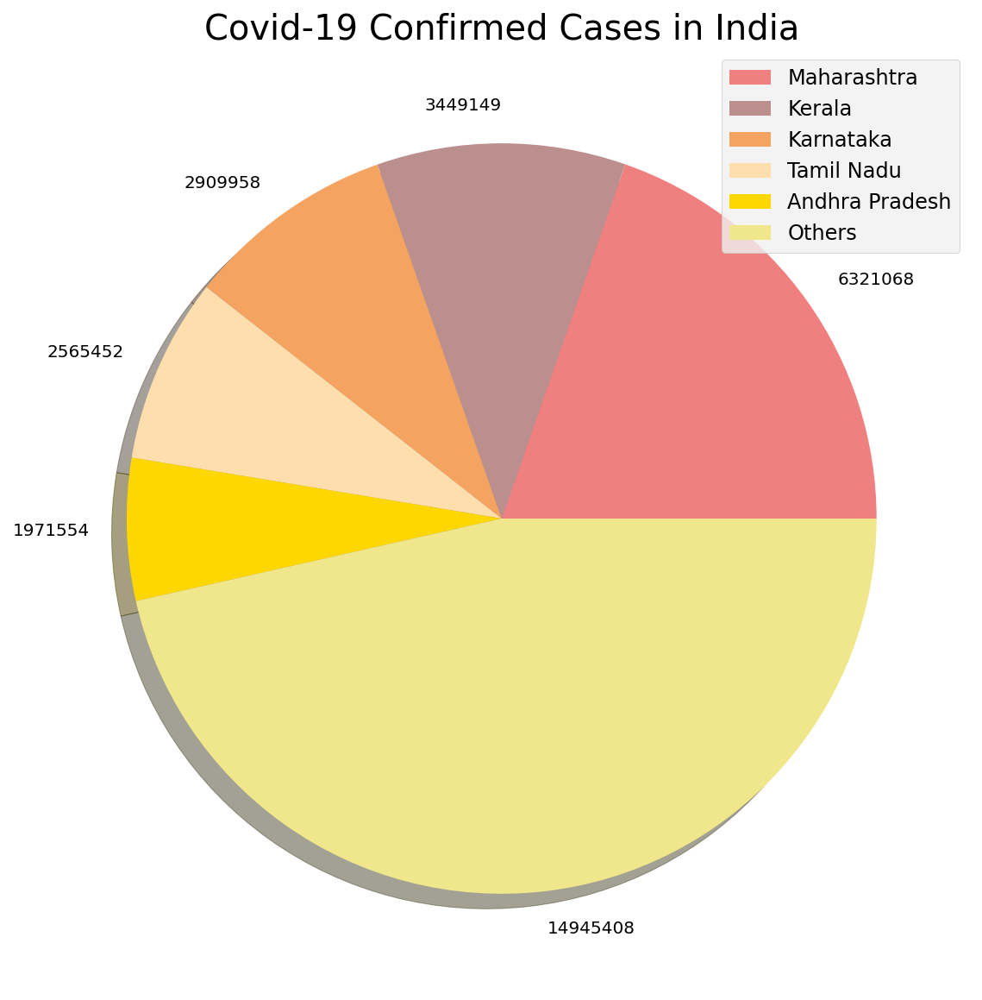

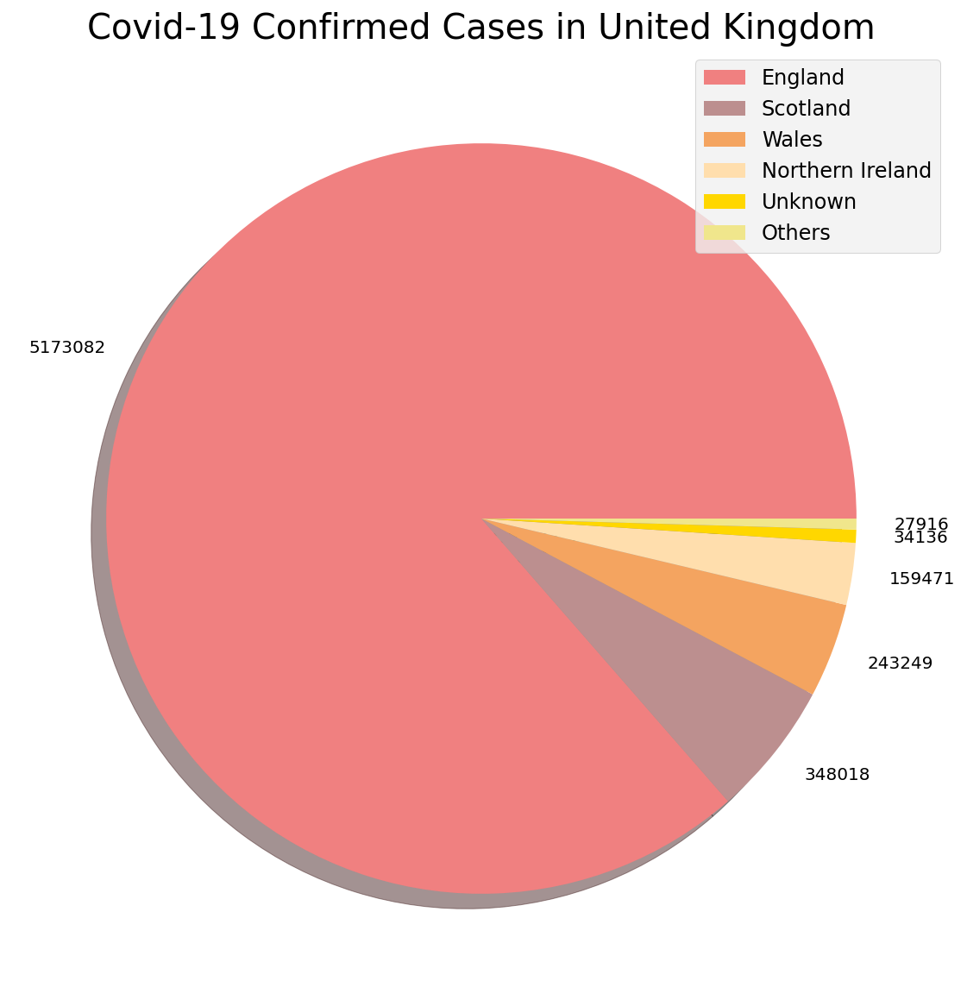

...

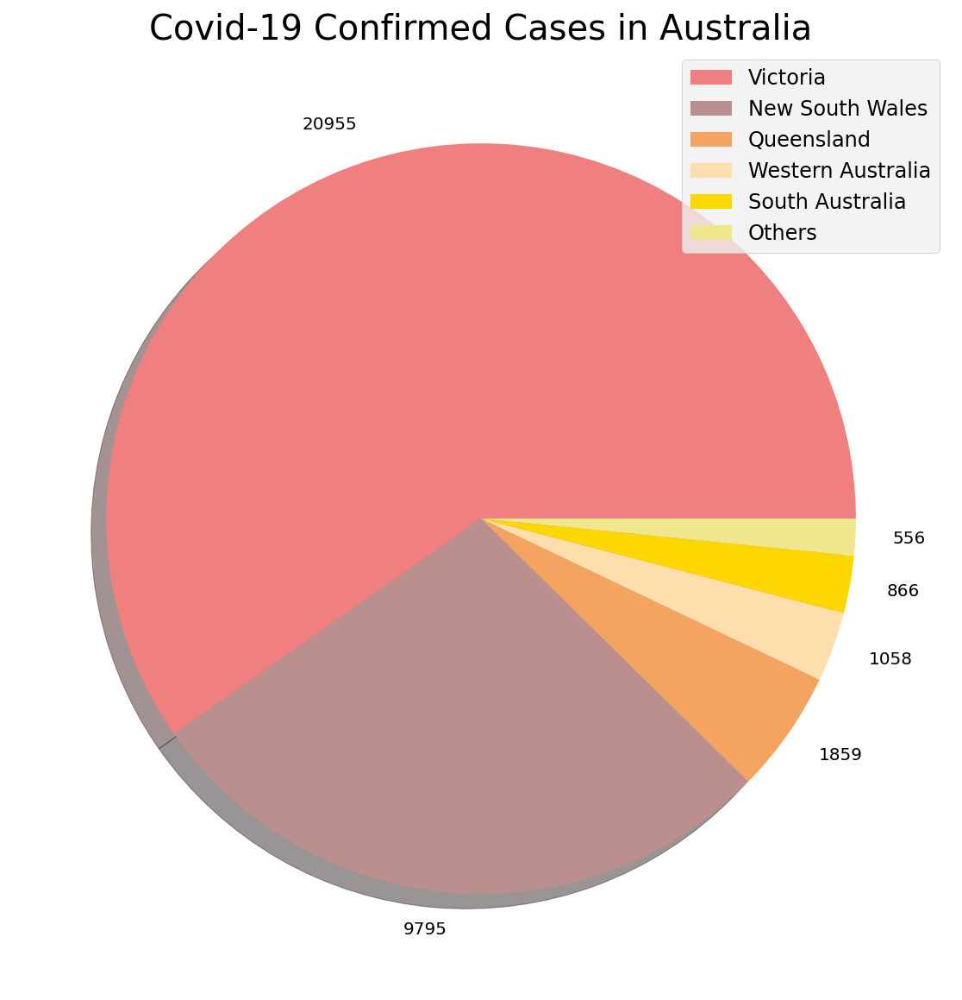

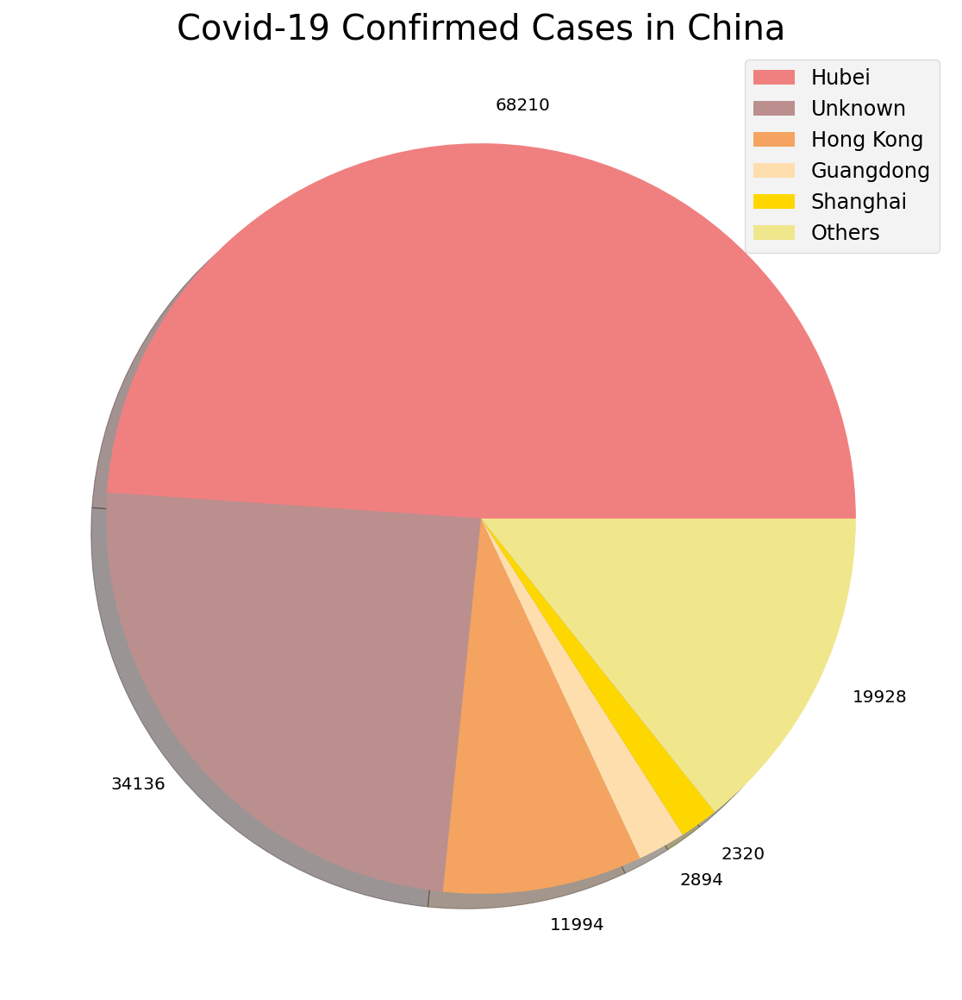

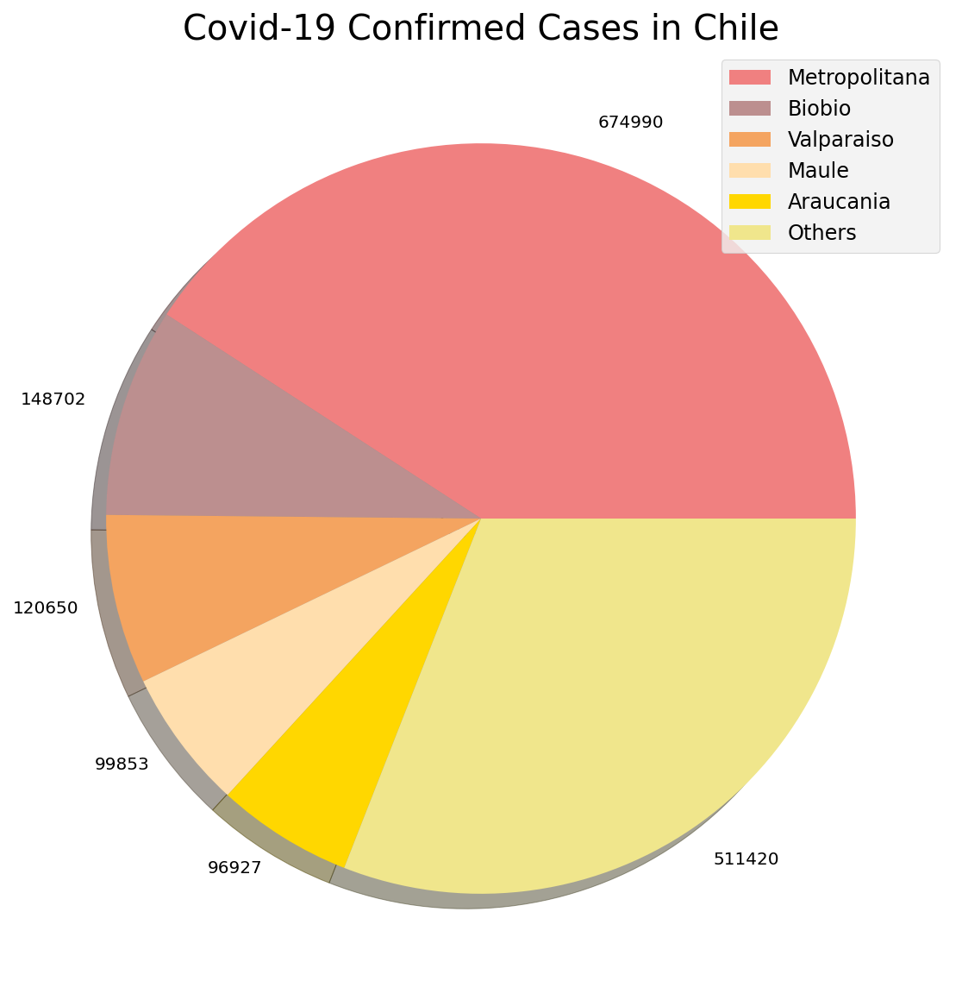

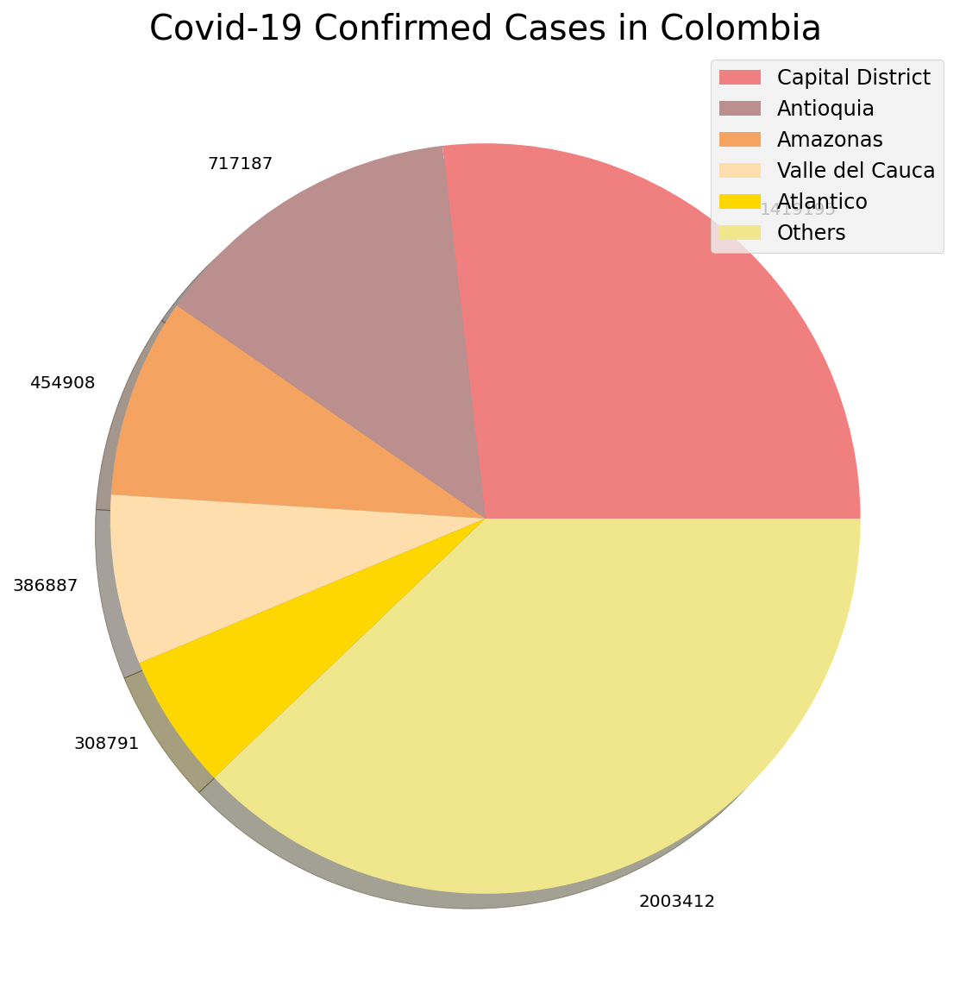

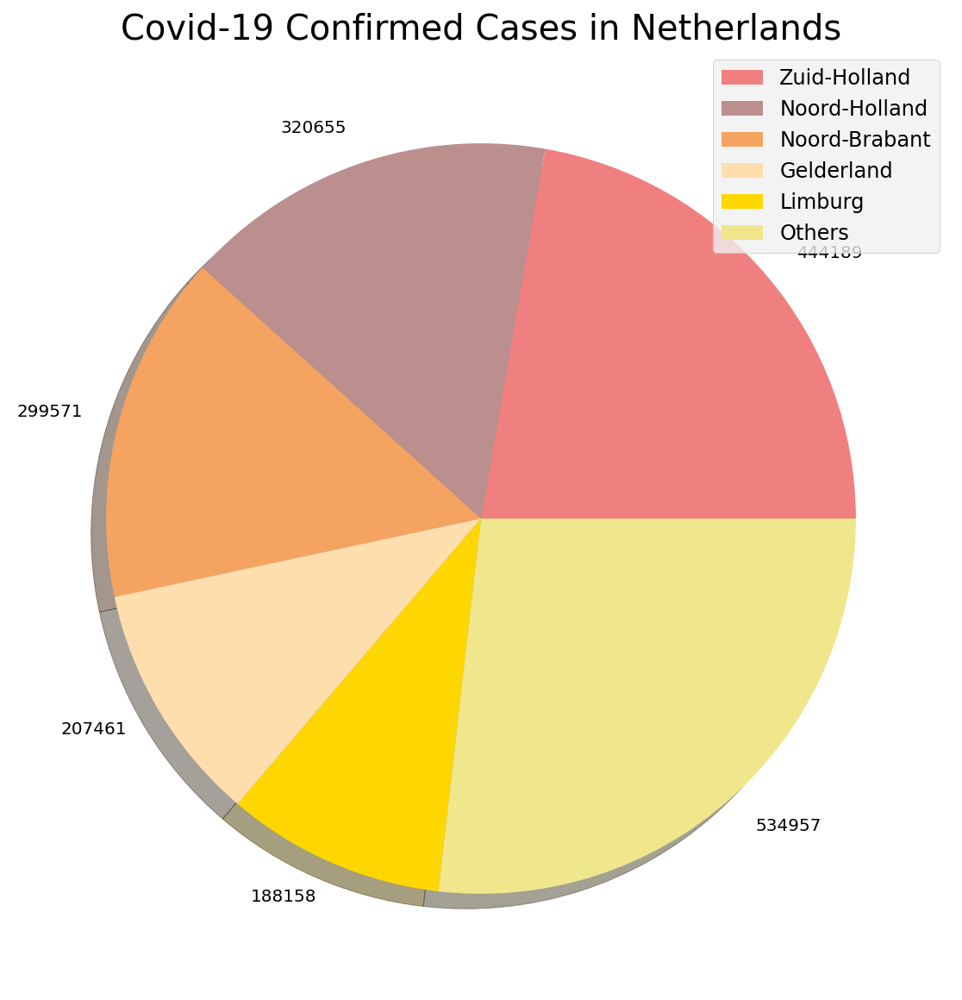

In [89]:
pie_chart_countries = ['US', 'Brazil', 'Russia', 'India', 'United Kingdom', 'Italy', 'Germany', 'France', 'Spain', 'Peru', 'Mexico', 'Canada', 
                       'Australia', 'China', 'Chile', 'Colombia', 'Netherlands']

for i in pie_chart_countries:
    plot_pie_country_with_regions(i, 'Covid-19 Confirmed Cases in {}'.format(i))

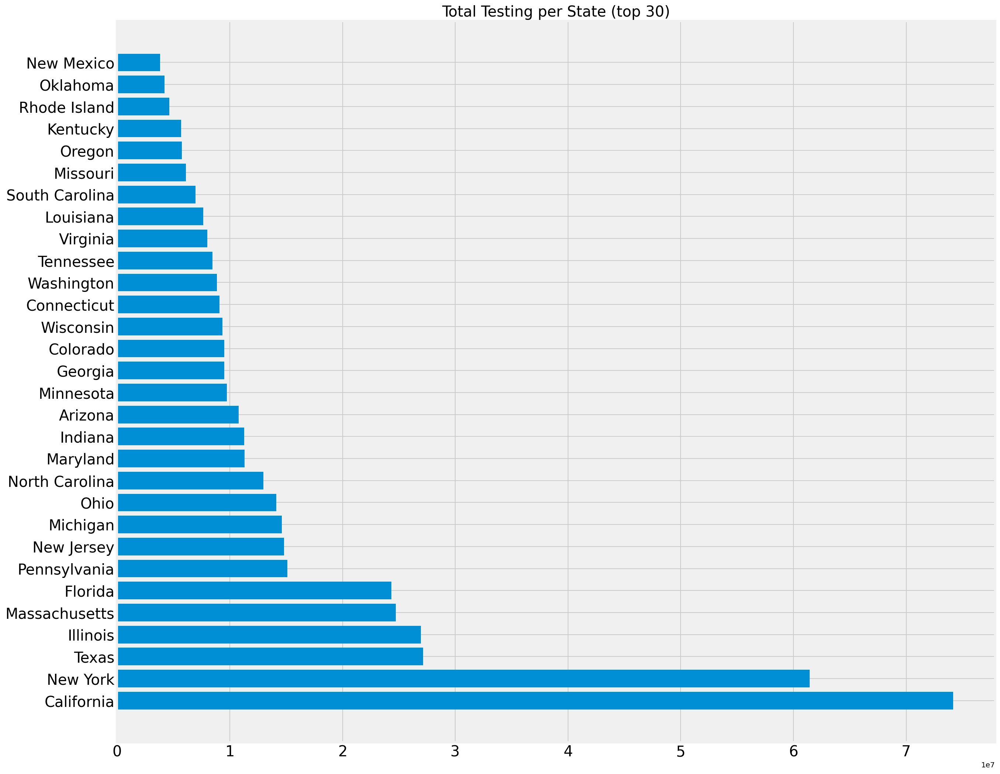

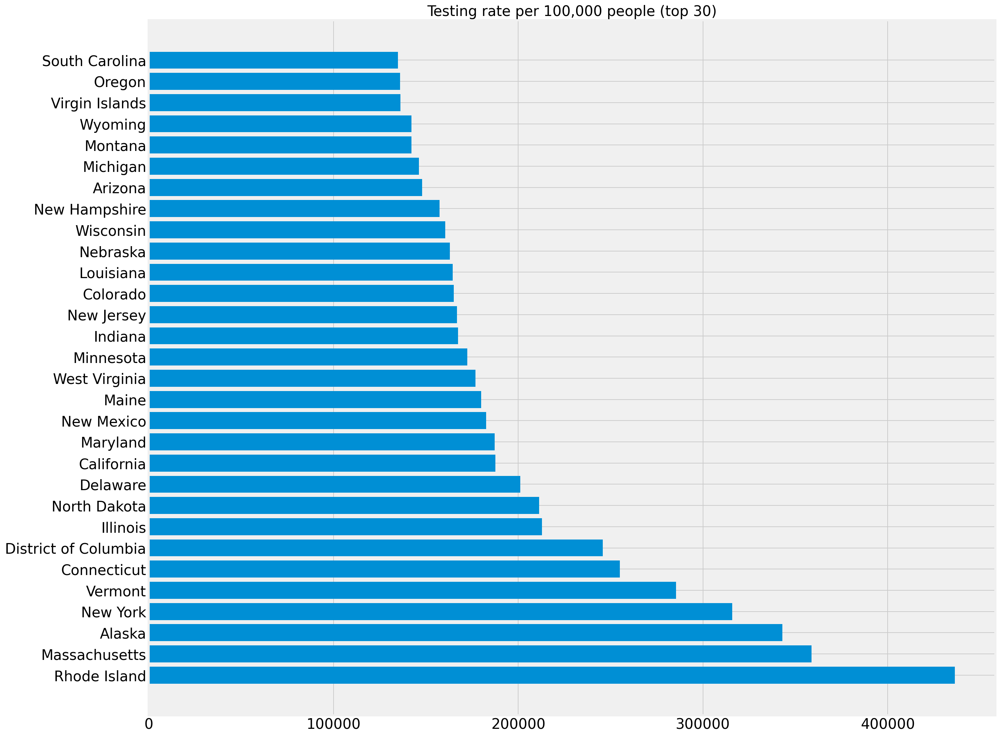

In [91]:
# US medical data on testing

us_medical_data.fillna(value=0, inplace=True)

def plot_us_medical_data():
  states = us_medical_data['Province_State'].unique()
  testing_number = []
  testing_rate = []

  for i in states:
    testing_number.append(us_medical_data[us_medical_data['Province_State'] == i]['Total_Test_Results'].sum())
    testing_rate.append(us_medical_data[us_medical_data['Province_State'] == i]['Testing_Rate'].max())

  # only show top 15 countries
  testing_states = [k for k, v in sorted(zip(states, testing_number), key=operator.itemgetter(1), reverse=True)]
  testing_rate_states = [k for k, v in sorted(zip(states, testing_rate), key=operator.itemgetter(1), reverse=True)]

  for i in range(len(states)):
    testing_number[i] = us_medical_data[us_medical_data['Province_State'] == testing_states[i]]['Total_Test_Results'].sum()
    testing_rate[i] = us_medical_data[us_medical_data['Province_State'] == testing_rate_states[i]]['Testing_Rate'].sum()

  top_limit = 30

  plot_bar_graphs_tall(testing_states[:top_limit], testing_number[:top_limit], 'Total Testing per State (top 30)')
  plot_bar_graphs_tall(testing_rate_states[:top_limit], testing_rate[:top_limit], 'Testing rate per 100,000 people (top 30)')

plot_us_medical_data()

In [92]:
# Apple's mobility data

def get_mobility_by_state(transport_type, state, day):
  return apple_mobility[apple_mobility['sub-region'] == state][apple_mobility['transportation_type'] == transport_type].sum()[day]

In [93]:
apple_mobility.head()

,geo_type,region,transportation_type,alternative_name,sub-region,country,2020-01-13,2020-01-14,2020-01-15,2020-01-16,...,2021-07-25,2021-07-26,2021-07-27,2021-07-28,2021-07-29,2021-07-30,2021-07-31,2021-08-01,2021-08-02,2021-08-03
0,country/region,Albania,driving,NaN,NaN,NaN,100.0,95.30,101.43,97.20,...,349.02,330.53,315.20,318.61,320.01,347.67,379.06,385.03,369.97,359.48
1,country/region,Albania,walking,NaN,NaN,NaN,100.0,100.68,98.93,98.46,...,253.82,291.86,270.02,276.76,269.64,285.67,295.10,281.36,321.45,305.67
2,country/region,Argentina,driving,NaN,NaN,NaN,100.0,97.07,102.45,111.21,...,75.03,79.49,81.46,83.51,87.12,107.44,121.10,76.60,69.50,73.32
3,country/region,Argentina,walking,NaN,NaN,NaN,100.0,95.11,101.37,112.67,...,52.75,70.94,71.21,70.80,76.64,89.37,92.05,53.20,64.84,70.74
4,country/region,Australia,driving,AU,NaN,NaN,100.0,102.98,104.21,108.63,...,72.95,76.87,89.22,93.40,98.98,97.09,70.08,80.33,82.22,85.13


In [94]:
get_mobility_by_state('walking', 'Connecticut', '2020-07-30')

1104.74

In [95]:
# Revising date to fit with the mobility format
revised_dates = []
for i in range(len(dates)):
  revised_dates.append(datetime.datetime.strptime(dates[i], '%m/%d/%y').strftime('%Y-%m-%d'))

In [96]:
# Returns true if it's a weekend and false if it's a weekday
def weekday_or_weekend(date):
  date_obj = datetime.datetime.strptime(date, '%Y-%m-%d')
  day_of_the_week = date_obj.weekday()
  if (day_of_the_week + 1) % 6 == 0 or (day_of_the_week + 1) % 7 == 0:
    return True
  else:
    return False

In [97]:
revised_day_since_1_22 = [i for i in range(len(revised_dates))]

In [99]:
import matplotlib.dates as mdates
states = ['New York', 'Connecticut', 'Florida', 'California', 'Texas']
states.sort()

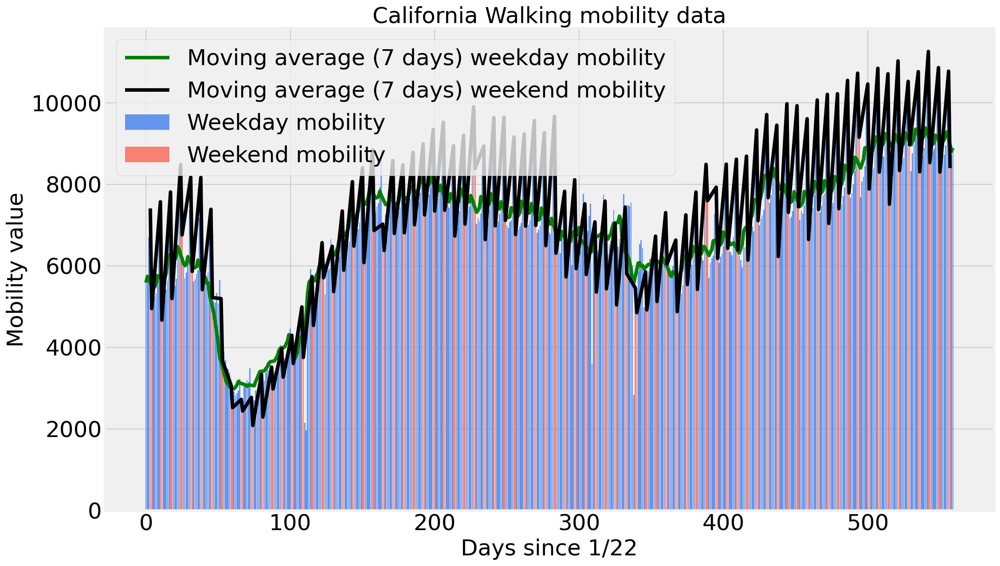

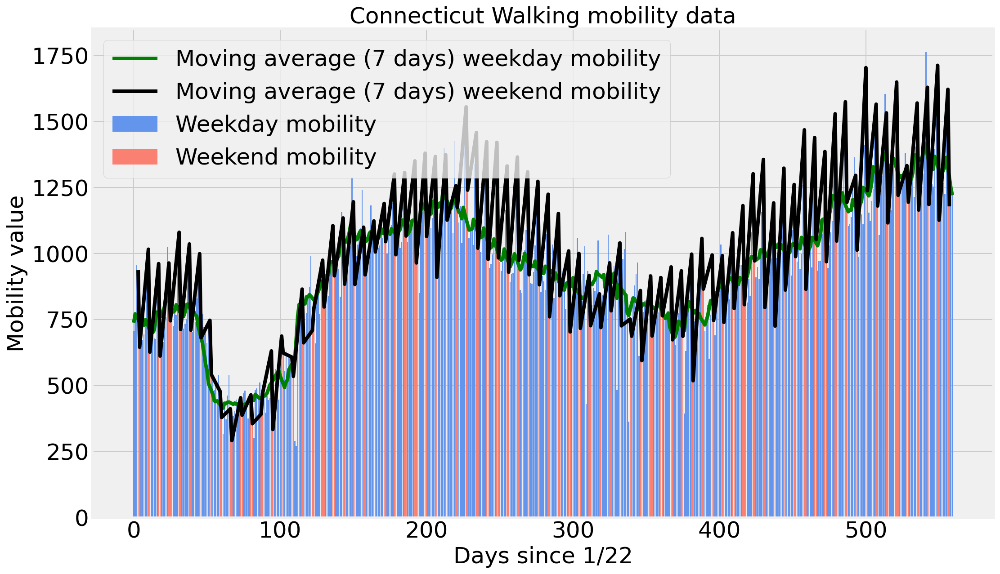

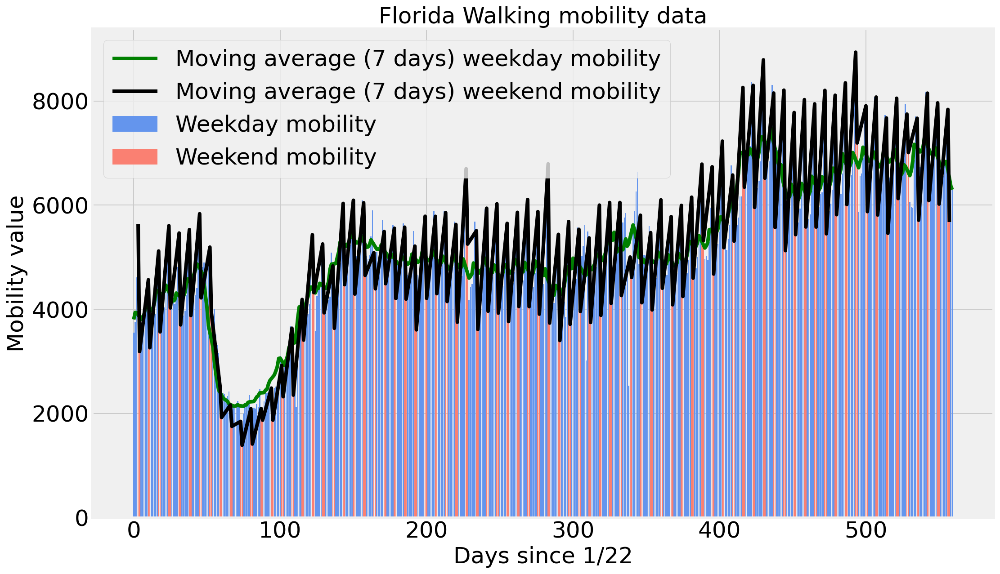

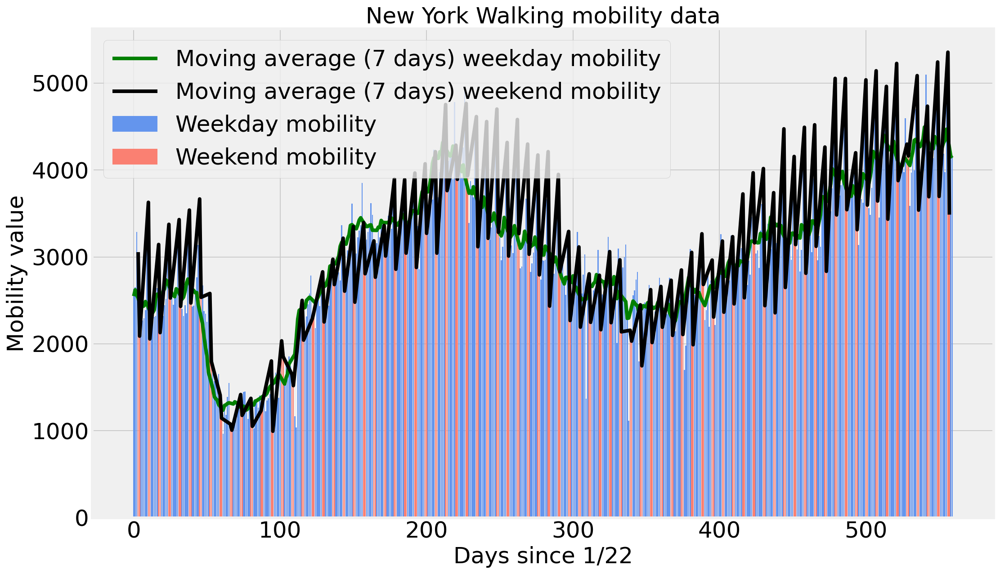

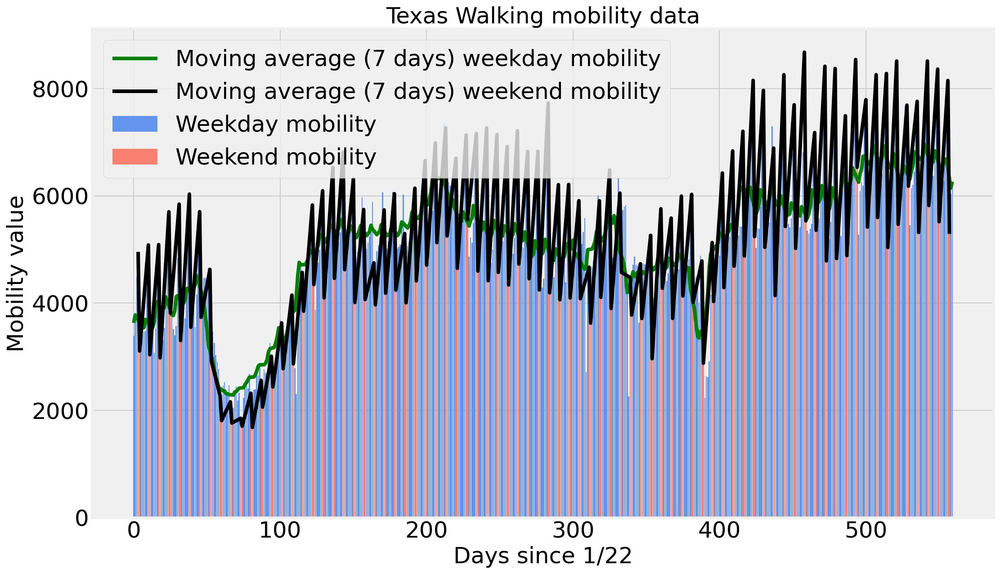

In [101]:
# Making sure dates are in sync
mobility_latest_date = apple_mobility.columns[-1]
mobility_latest_index = revised_dates.index(mobility_latest_date)

for state in states:
  weekday_mobility = []
  weekday_mobility_dates = []
  weekend_mobility = []
  weekend_mobility_dates = []

  for i in range(len(revised_dates)):
    if i <= mobility_latest_index:
      if weekday_or_weekend(revised_dates[i]):
        weekend_mobility.append(get_mobility_by_state('walking', state, revised_dates[i]))
        weekend_mobility_dates.append(i)
      else:
        weekday_mobility.append(get_mobility_by_state('walking', state, revised_dates[i]))
        weekday_mobility_dates.append(i)
    else:
      pass
  
  # remove null values (they are counted as 0)
  for i in range(len(weekend_mobility)):
    if weekend_mobility[i] == 0 and i != 0:
      weekend_mobility[i] = weekend_mobility[i - 1]
    elif weekend_mobility[i] == 0 and i == 0:
      weekend_mobility[i] = weekend_mobility[i + 1]
    else:
      pass

  for i in range(len(weekday_mobility)):       
      if weekday_mobility[i] == 0 and i != 0:
          weekday_mobility[i] = weekday_mobility[i-1]
      elif weekday_mobility[i] == 0 and i == 0:
          weekday_mobility[i] = weekday_mobility[i+1]
      else:
          pass
  
  weekday_mobility_average = moving_average(weekday_mobility, 7)
  weekend_mobility_average = moving_average(weekend_mobility, 7)

  plt.figure(figsize=(16, 10))
  plt.bar(weekday_mobility_dates, weekday_mobility, color='cornflowerblue')
  plt.plot(weekday_mobility_dates, weekday_mobility_average, color = 'green')

  plt.bar(weekend_mobility_dates, weekend_mobility, color='salmon')
  plt.plot(weekend_mobility_dates, weekend_mobility, color='black')

  plt.legend(['Moving average (7 days) weekday mobility', 'Moving average (7 days) weekend mobility', 'Weekday mobility', 'Weekend mobility'], prop={'size': 25})
  plt.title('{} Walking mobility data'.format(state), size=25)
  plt.xlabel('Days since 1/22', size=25)
  plt.ylabel('Mobility value', size=25)
  plt.xticks(size=25)
  plt.yticks(size=25)
  plt.show()